In [ ]:
import pandas as pd
import os
from tqdm import tqdm
import argparse
import yaml
import matplotlib.pyplot as plt
import seaborn as sns

from utils import *

Loading BokehJS ...

In [2]:
config = yaml.safe_load(open('/Users/ursic/PhD/Projects/1_DataAnalysis_zebrafish/beads_in_zebrafish/magnetic_tweezers_SD/config.yml'))

filepath_measurements_info = config['filepath_measurements_info']
dir_plots = os.path.join(config['dir_parent'], '3_plots')  # Folder for saving plots
dir_analysis = os.path.join(config['dir_parent'], '2_analysis')  # Folder for saving analysis results
recalculate = config['recalculate']  # Whether to recalculate measurements if they already exist
pix_size = config['pix_size'] 

In [3]:
df_general_info = pd.read_csv(filepath_measurements_info, delimiter=';', encoding='utf-8')
df_general_info = df_general_info.sort_values(by='trackmate_file')
df_general_info.head()

,trackmate_file,MTs,first_pulse (frame),last_pulse (frame),t_on (frame),t_off (frame),tip_x,tip_y,calibration (mV),bead_type,time_interval (s),comments
0,/Volumes/cytokinesis-zebrafish-collab/magnetic...,n,131,251,10,30,98,378,1000,2.8 um myc dyna passivated PEG,0.5,NaN
1,/Volumes/cytokinesis-zebrafish-collab/magnetic...,n,169,249,10,30,98,378,1000,2.8 um myc dyna passivated PEG,0.5,NaN
2,/Volumes/cytokinesis-zebrafish-collab/magnetic...,y,13,653,10,30,53,314,1000,2.8 um myc dyna passivated PEG,0.5,NaN
3,/Volumes/cytokinesis-zebrafish-collab/magnetic...,n,11,611,10,30,57,360,1000,2.8 um myc dyna passivated PEG,0.5,"one bead stuck during pulses 7,8,9,10"
4,/Volumes/cytokinesis-zebrafish-collab/magnetic...,y,11,531,10,30,82,254,1000,2.8 um myc dyna passivated PEG,0.5,NaN


In [4]:
save_to_server = True

20240523_s01p01t01_1_5sON_15sOFF_spots
20240523_s01p01t021_1_5sON_15sOFF_spots
20240523_s02p01t01_1_5sON_15sOFF_spots
[ 4.32751868 47.44452361]


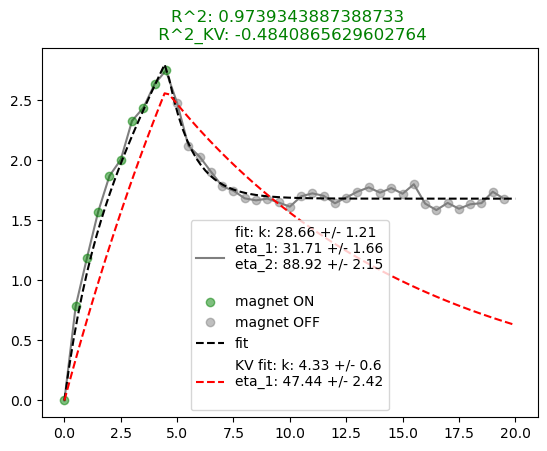

[ 7.11050404 59.62032586]


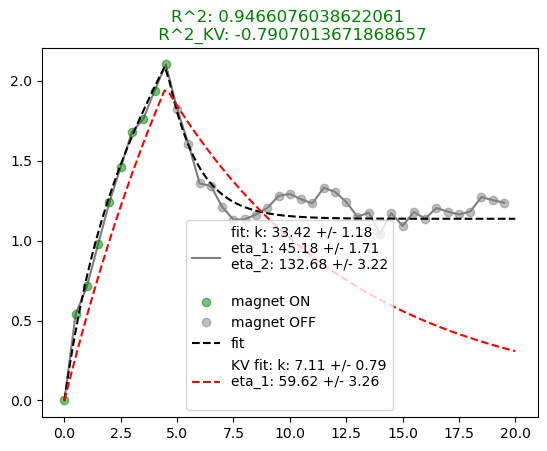

[16.38573569 37.69161377]


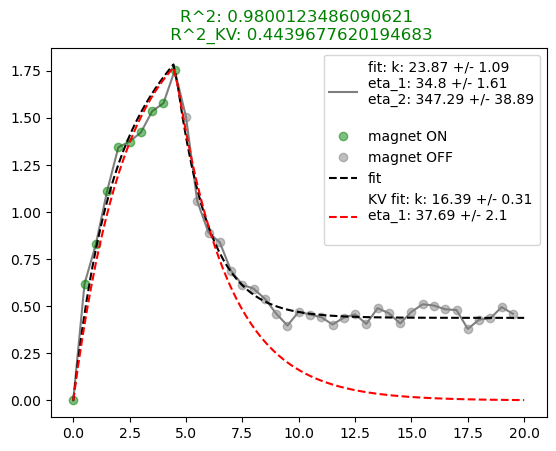

[ 3.08942724 37.83576861]


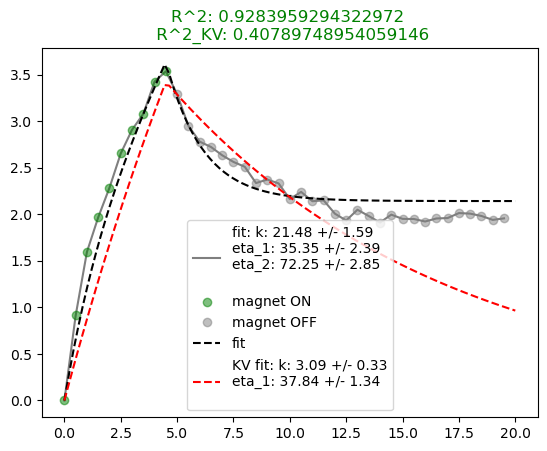

[ 9.14330764 49.46474034]


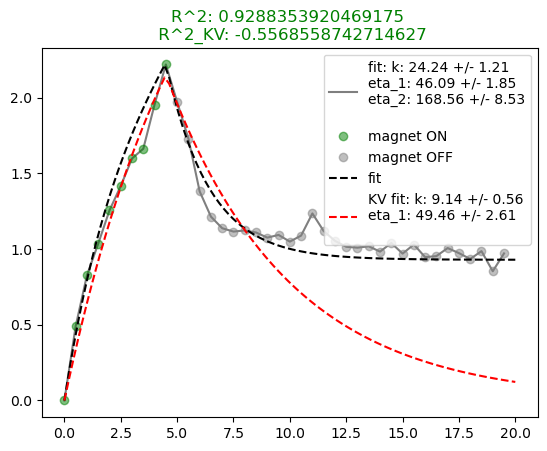

[ 0.60680775 27.56708658]


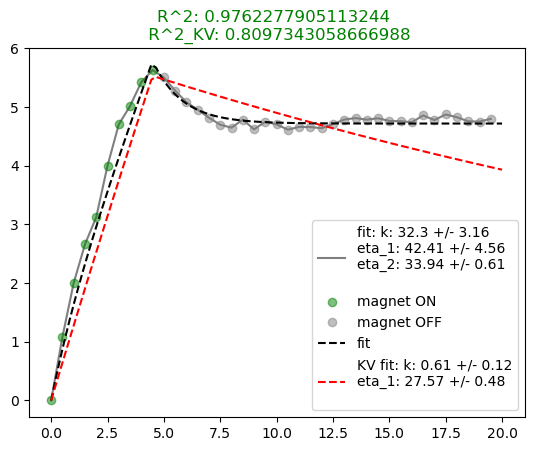

[ 2.39708054 34.42381577]


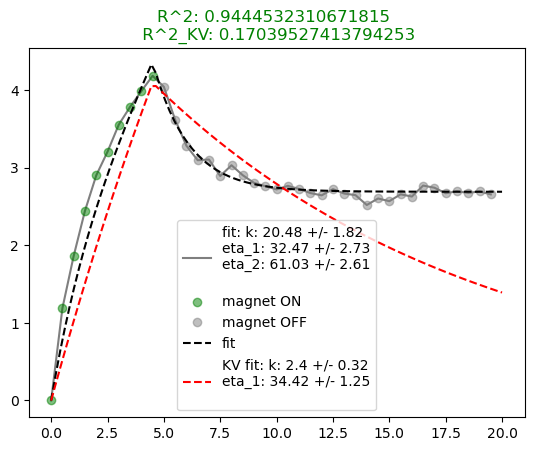

[3.06185771e-02 4.26070007e+01]


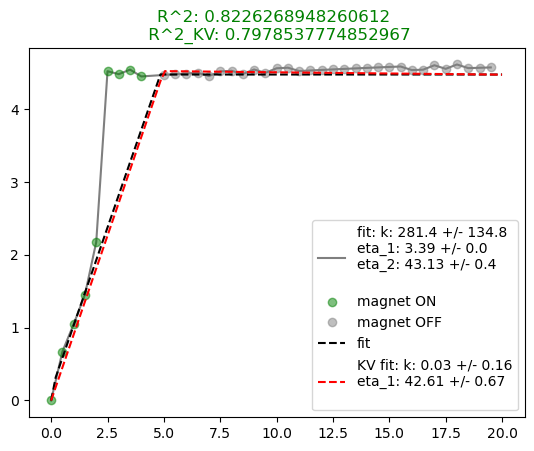

[14.88353032 36.49564574]


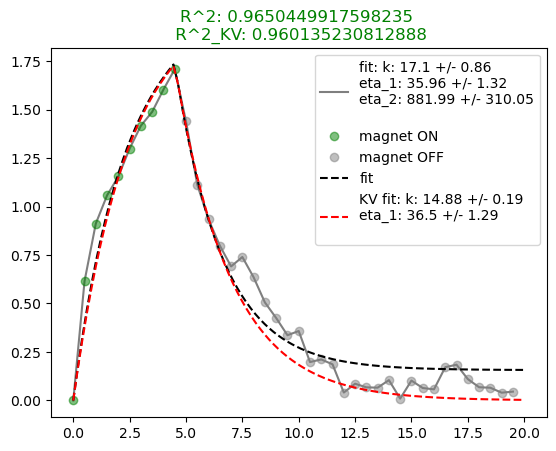

[13.33406324 45.72416691]


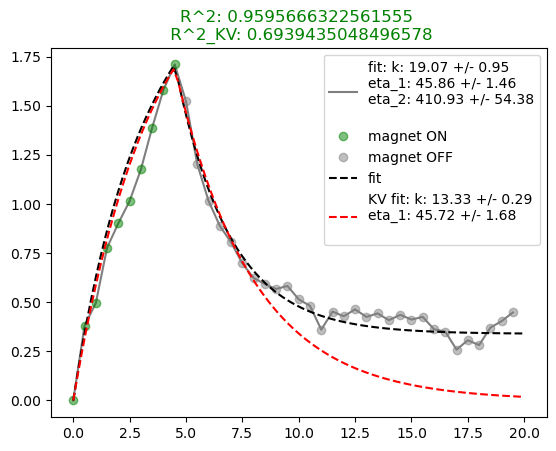

[ 4.62366062 48.90467665]


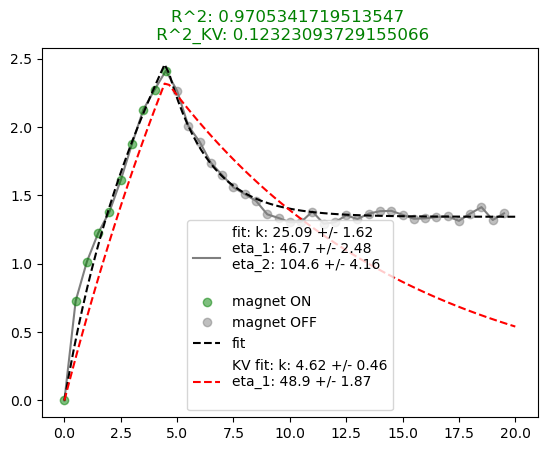

[12.900977   56.45436635]


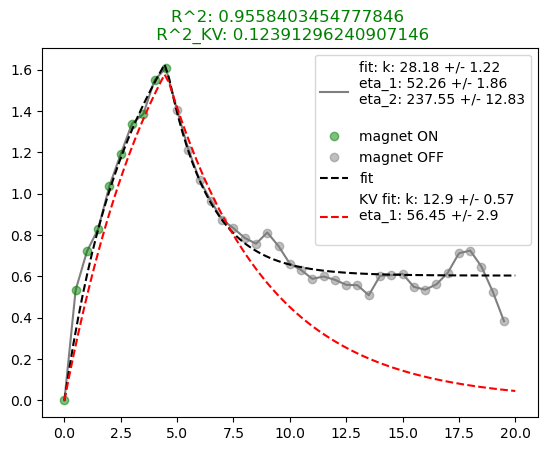

[12.55180125 48.18121184]


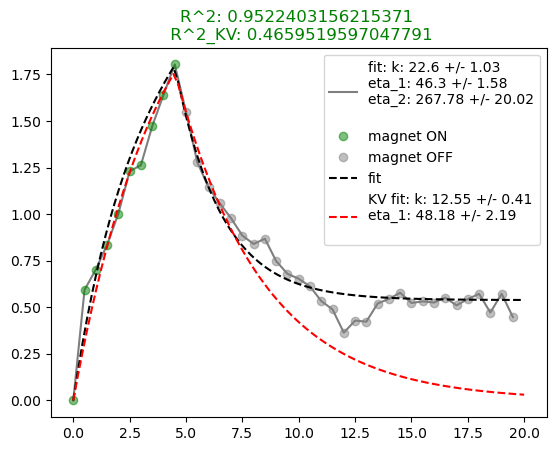

[13.64683163 39.07114571]


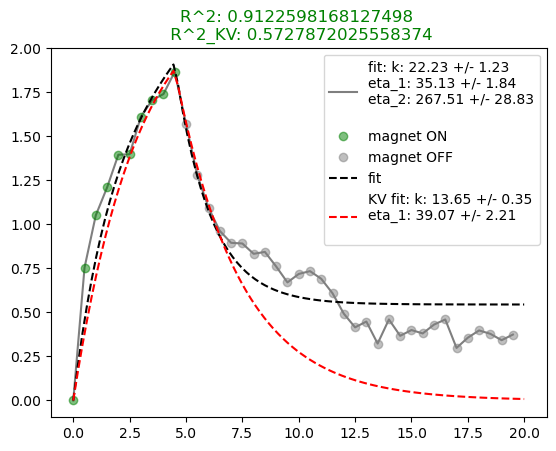

[ 9.27183367 70.03412197]


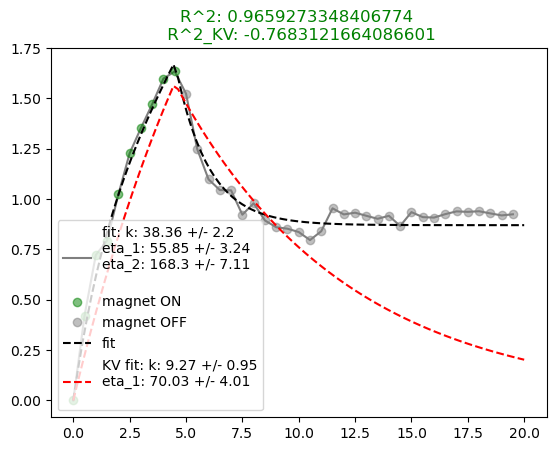

[15.60046654 57.2437636 ]


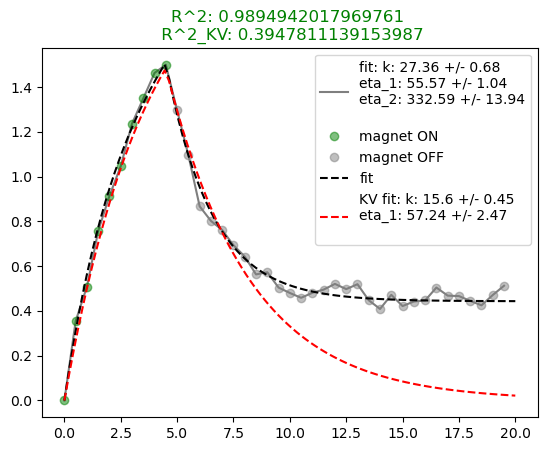

[15.83975084 63.2411091 ]


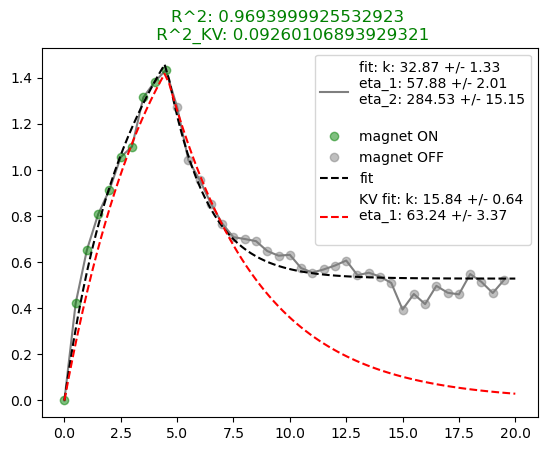

[ 8.54061511 60.51664086]


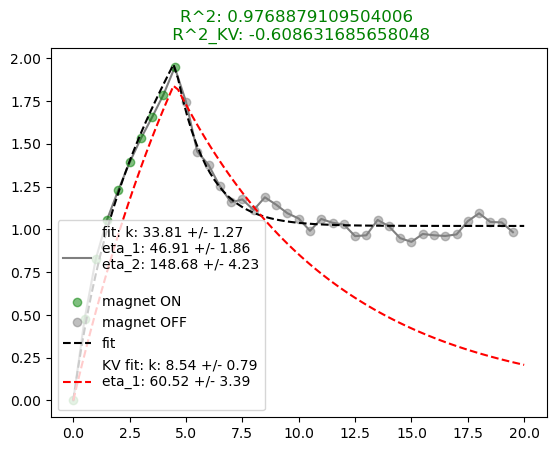

[ 9.67880706 44.84660537]


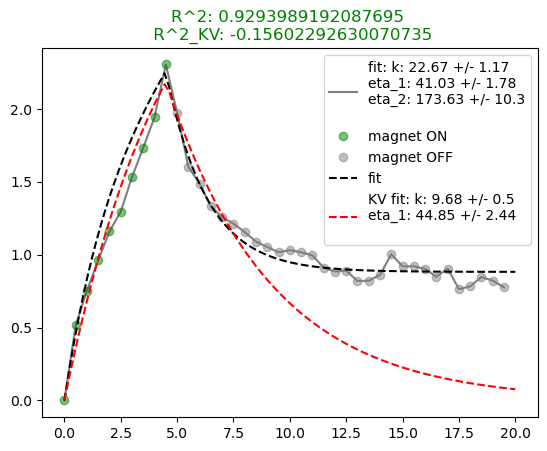

[ 7.85140221 45.62594188]


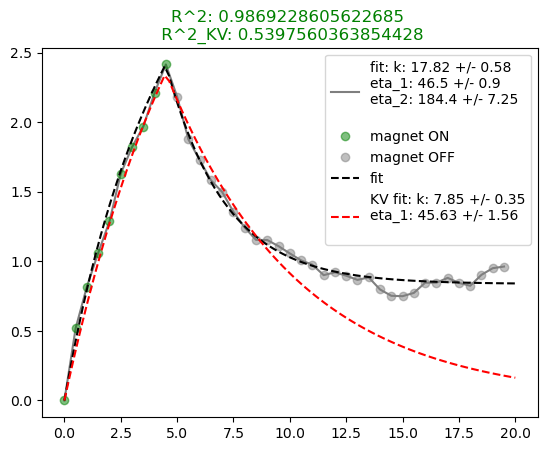

[14.23699409 44.07821909]


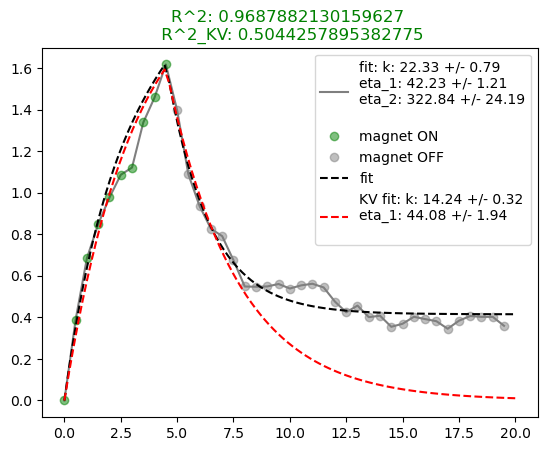

[ 4.75736295 39.69169168]


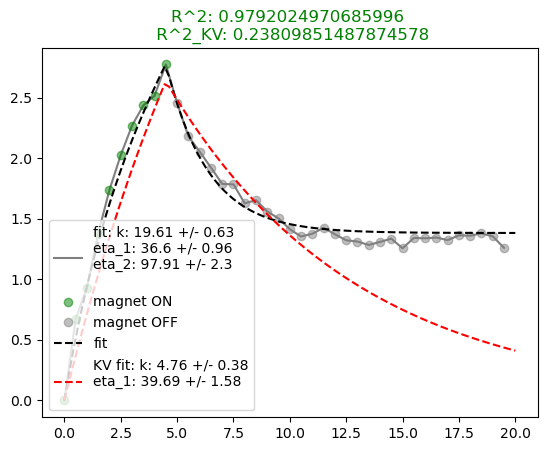

[ 3.03217826 31.83787451]


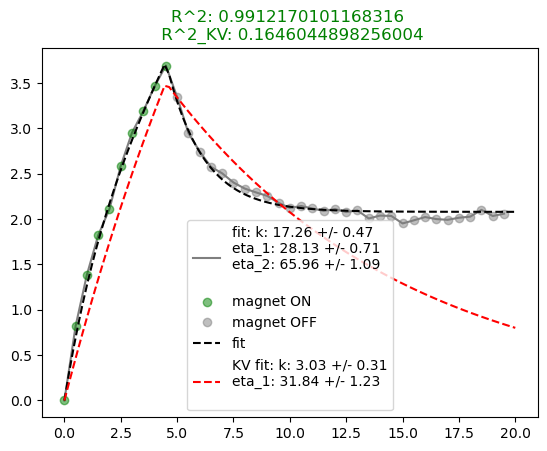

[10.06141826 40.20496151]


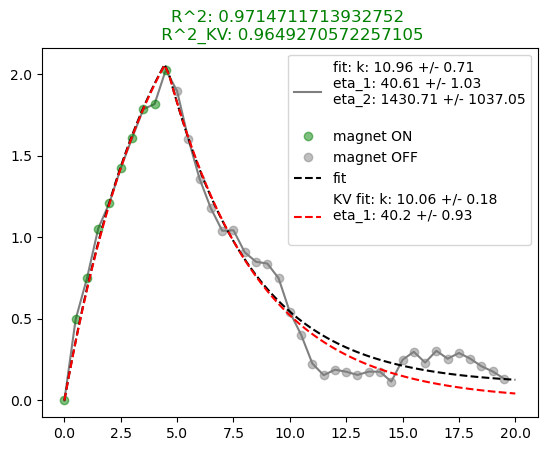

[ 4.64724017 42.99667049]


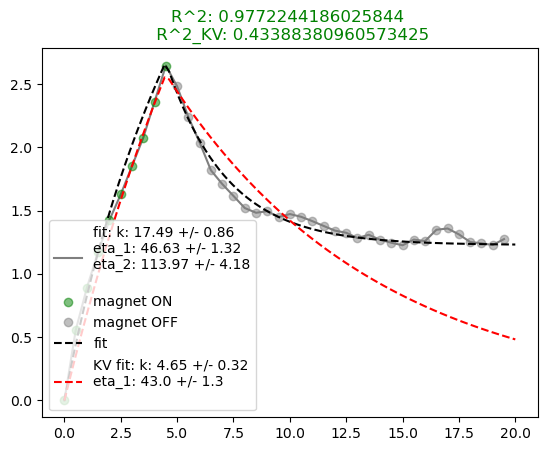

[ 5.115439   35.98659083]


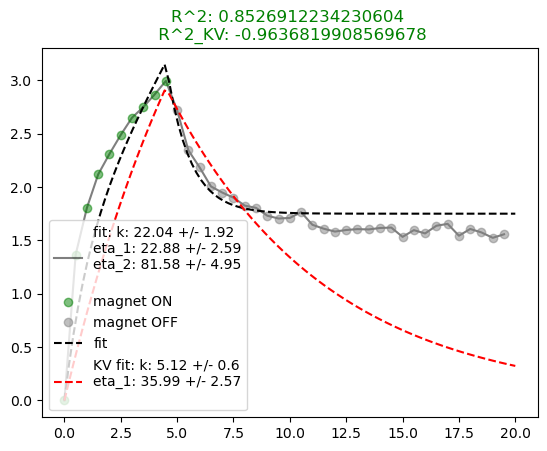

[ 4.66657382 50.13790408]


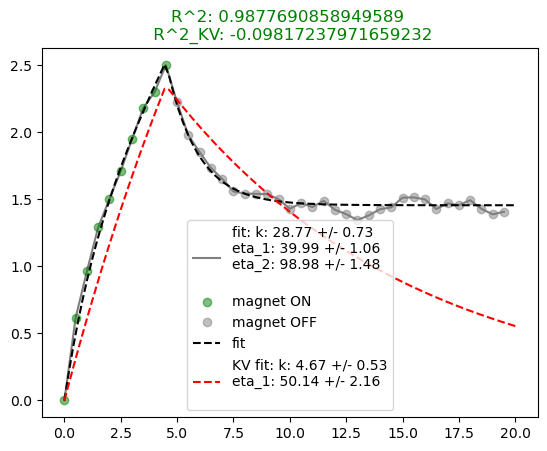

[ 0.79522499 32.60316292]


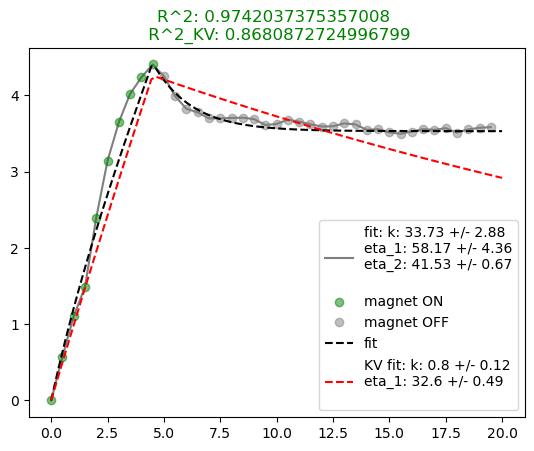

[ 3.64395133 44.50068532]


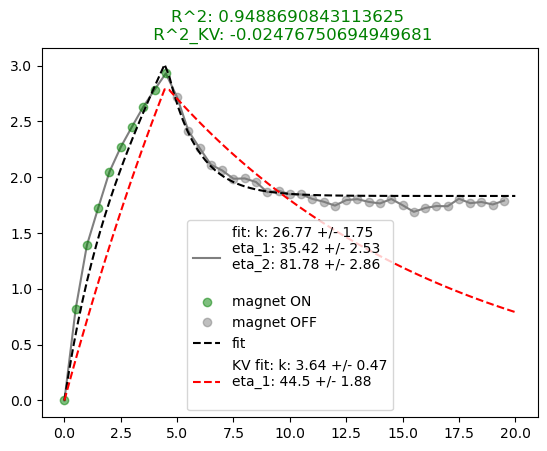

[ 4.82895205 46.01479048]


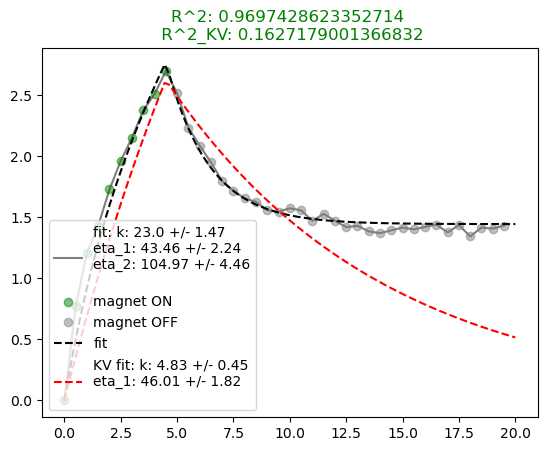

[ 7.32549309 50.36555724]


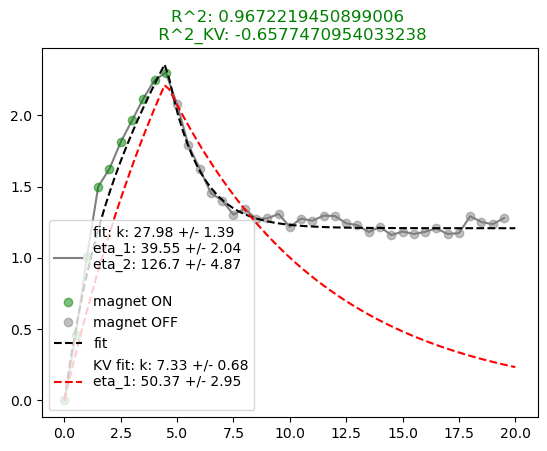

20240523_s02p01t02_1_5sON_15sOFF_spots
[ 0.33635402 22.98632865]


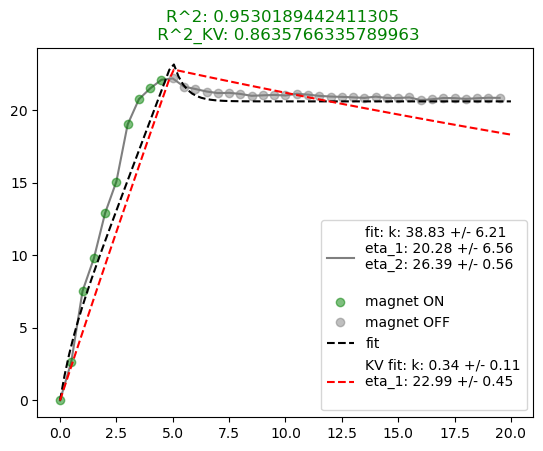

[ 0.18152622 10.26001502]


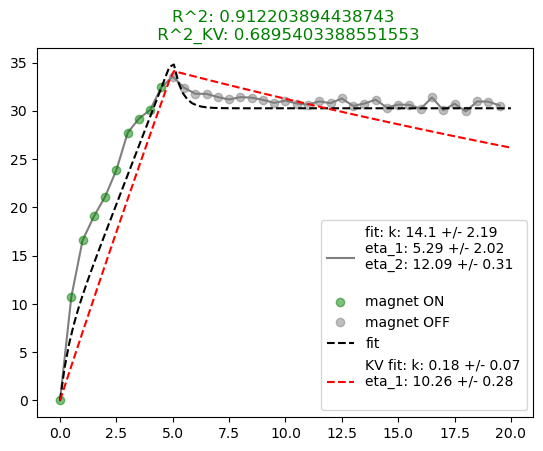

[ 2.49804587 38.91699065]


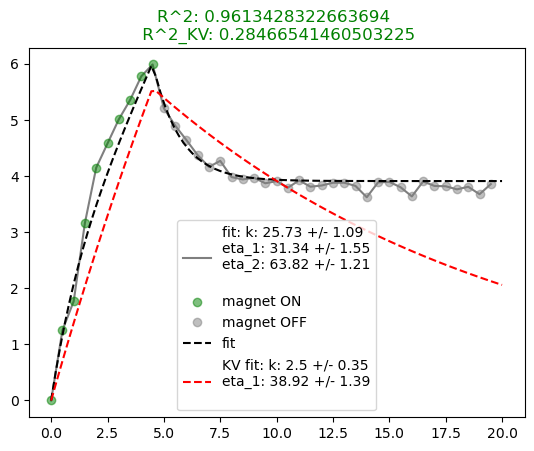

[ 3.33216689 39.82603334]


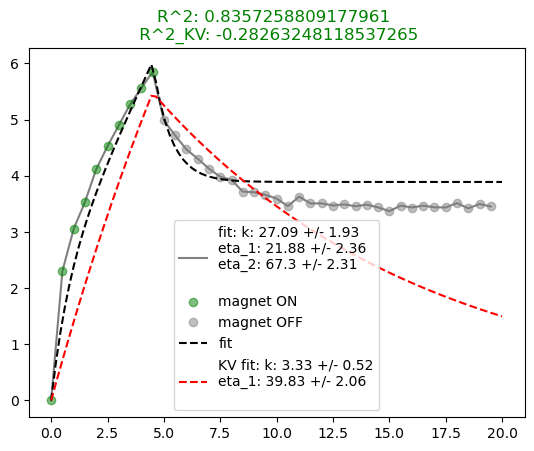

[11.46672625 42.04044798]


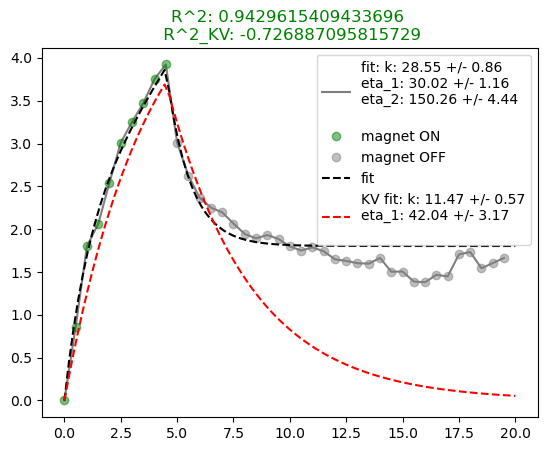

[ 0.15455573 11.55062004]


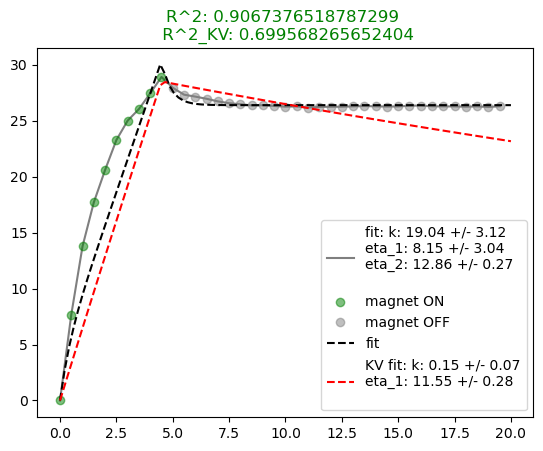

[ 0.43069947 22.2085478 ]


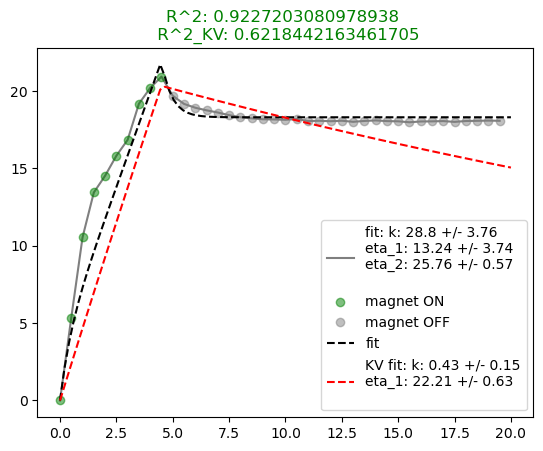

[ 2.78541108 60.29152809]


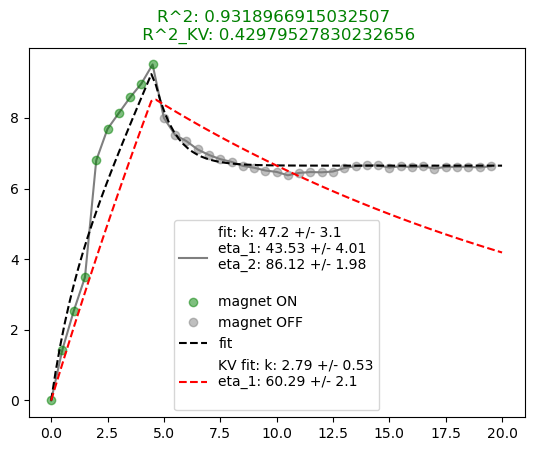

[ 3.76715272 23.08002732]


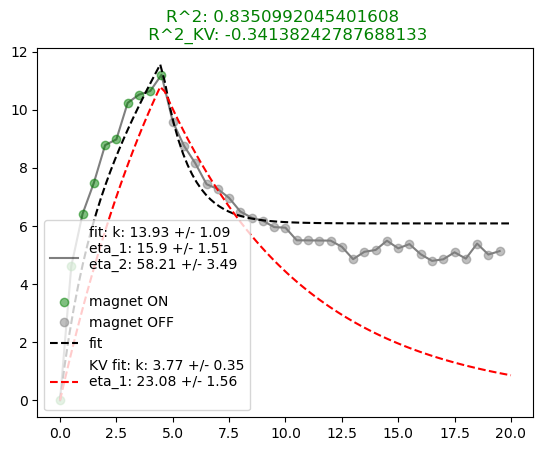

[ 2.02875258 27.71161089]


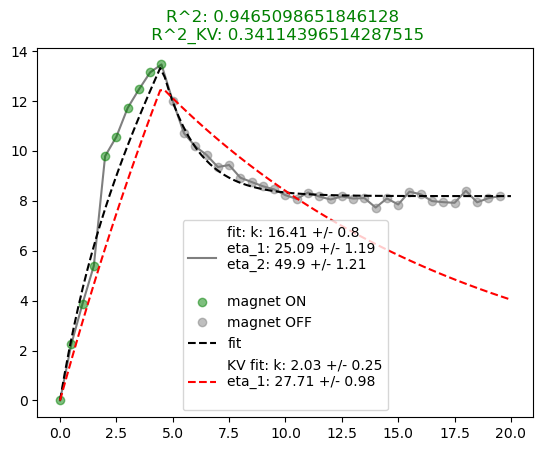

[ 0.22846623 18.87199539]


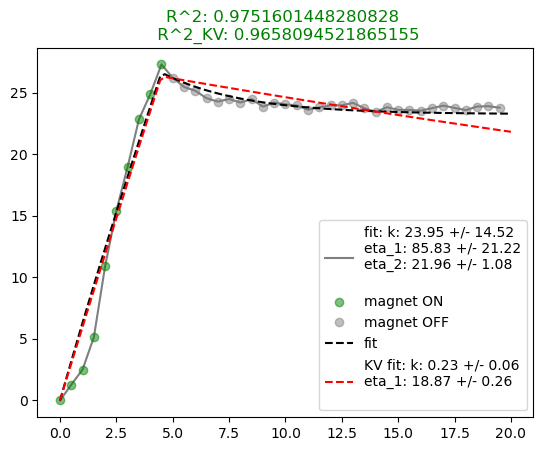

[26.99031279 52.6543704 ]


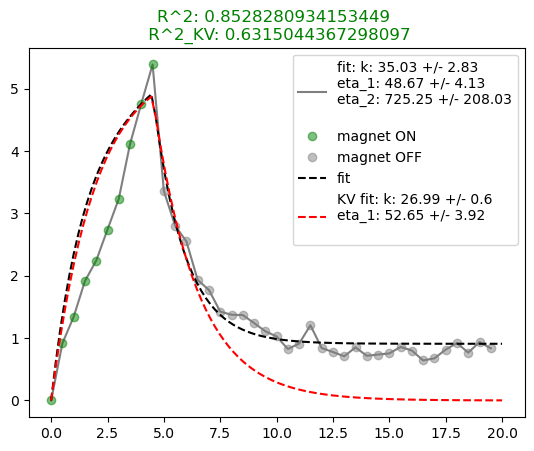

20240614_s02p02t01_2_5sON_15sOFF_spots
[10.77076989 67.11510965]


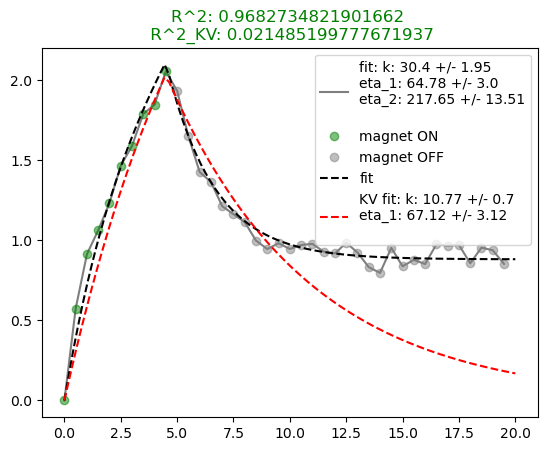

[19.91287499 62.34374337]


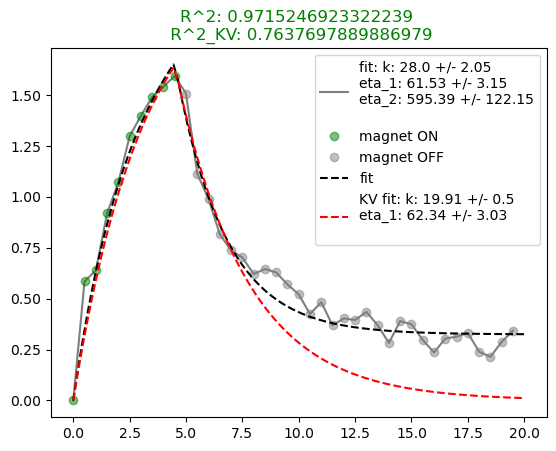

[ 7.21060345 77.98261556]


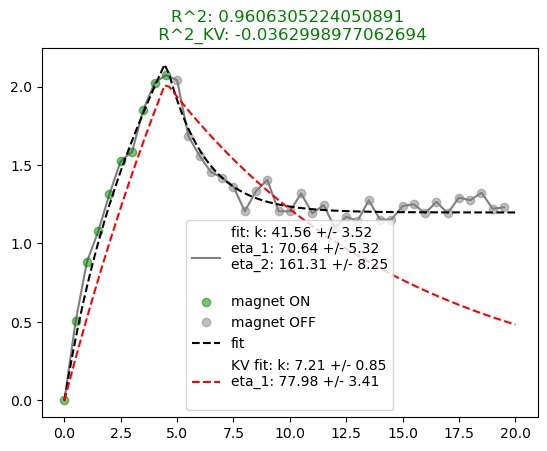

[19.13842449 78.12584572]


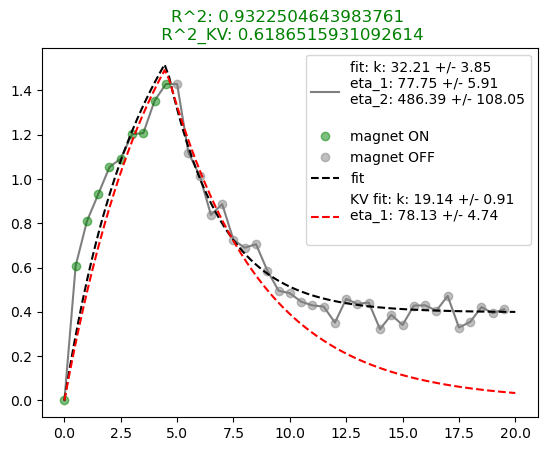

[10.86229915 70.95729208]


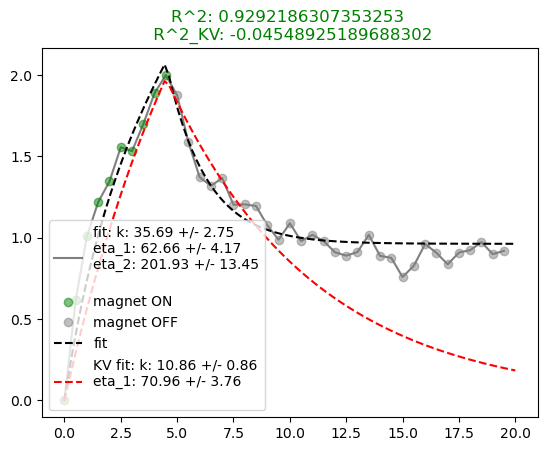

[15.54023719 78.9325116 ]


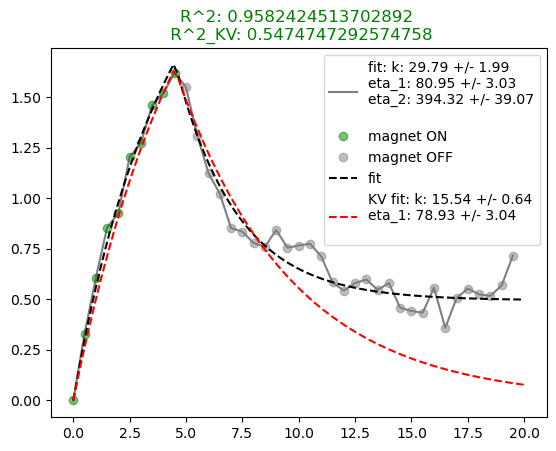

[22.05741196 73.54942912]


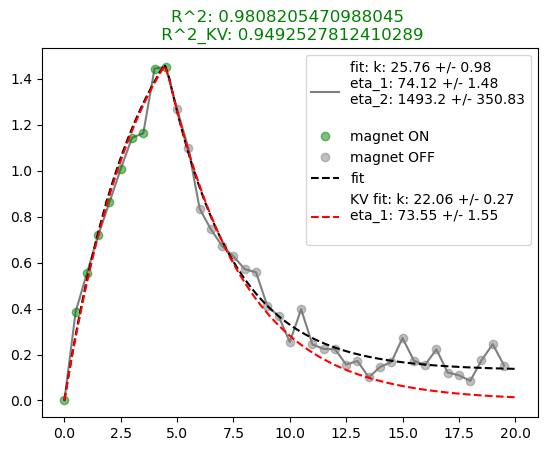

[ 5.35626968 71.35036796]


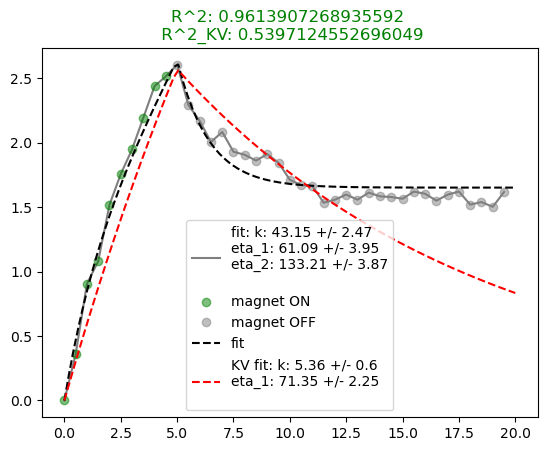

[ 6.81585807 53.4415051 ]


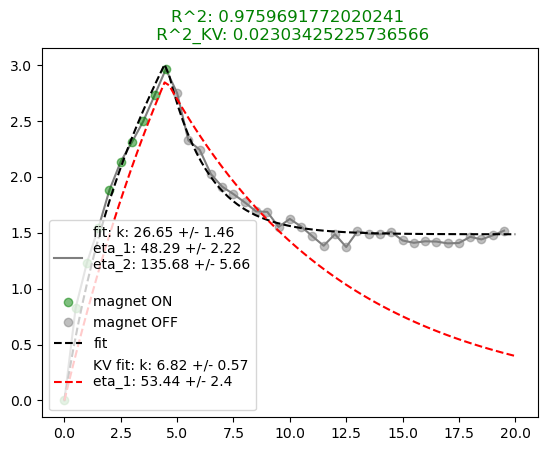

[ 7.04372817 60.74389851]


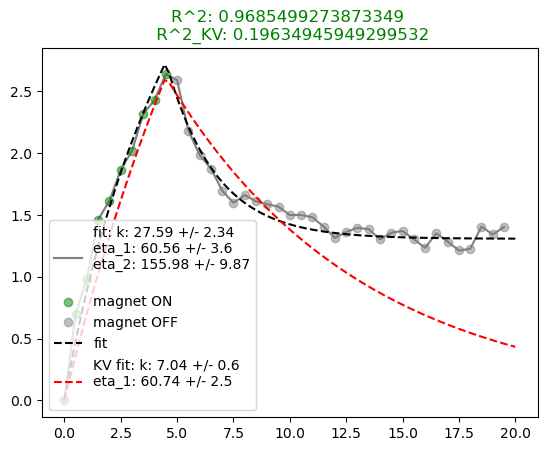

[ 4.57182526 58.05614889]


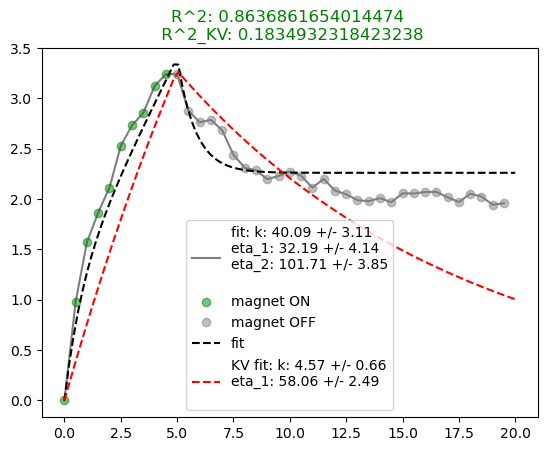

[7.08077137e-12 5.51506139e+02]


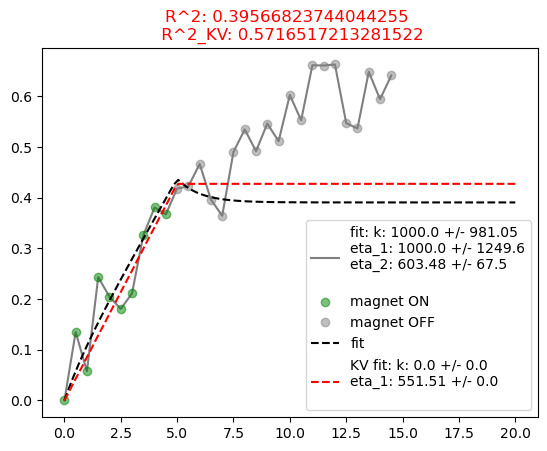

20240618_s01p02t01_2_5sON_15sOFF_spots
[ 0.29052398 12.51196164]


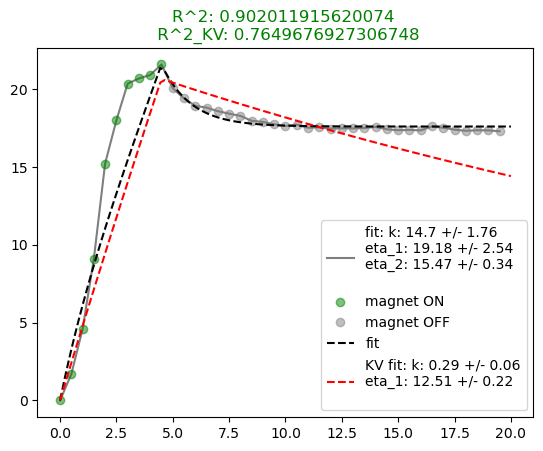

[ 0.10396159 11.45749872]


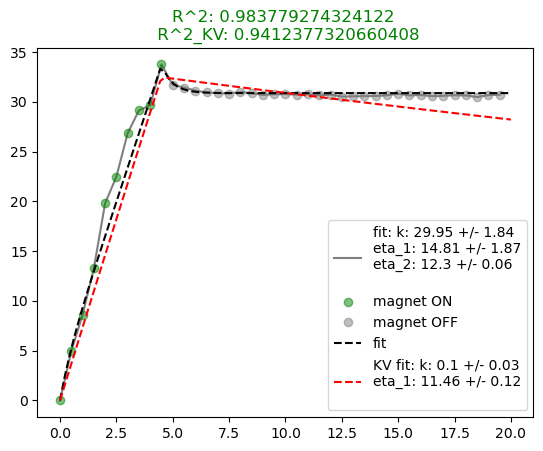

[ 5.04086019 61.39171817]


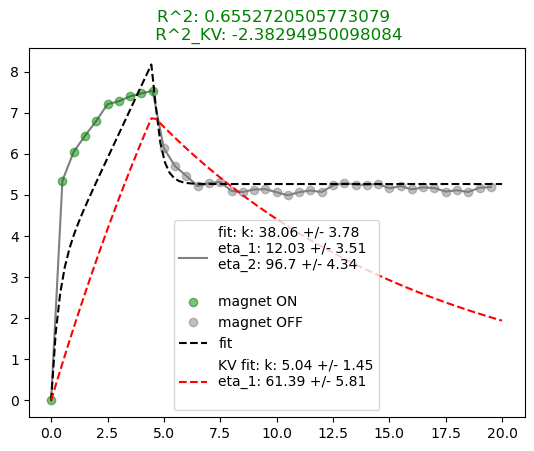

[ 1.1095407  51.22487599]


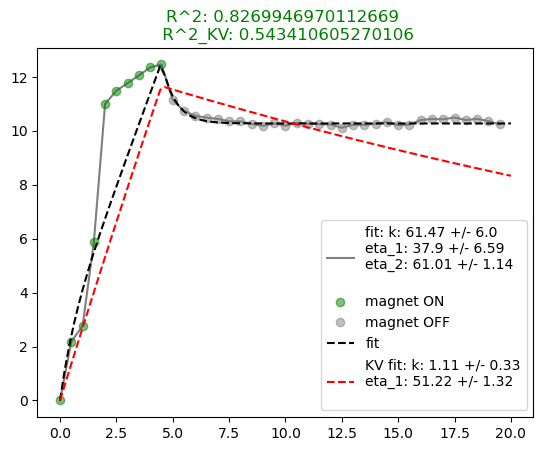

20240621_s01p01t01_2_5sON_15sOFF_spots
[19.74858813 80.02223211]


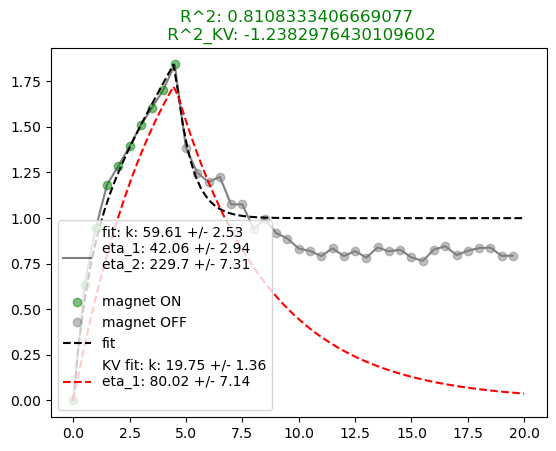

[53.55261046 74.50051416]


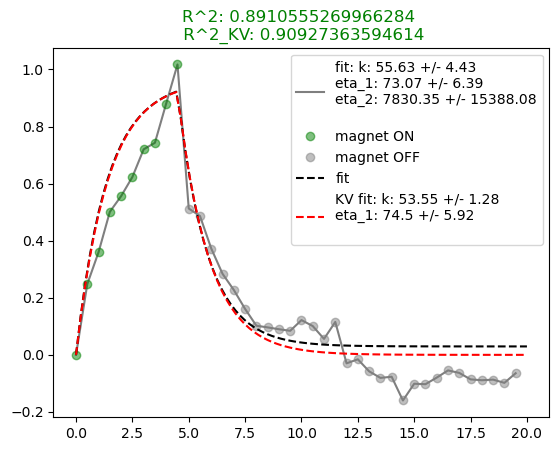

[27.94140016 82.00960041]


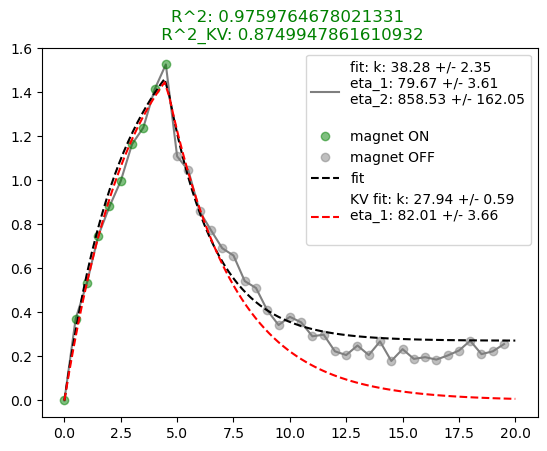

[46.65372736 75.03994304]


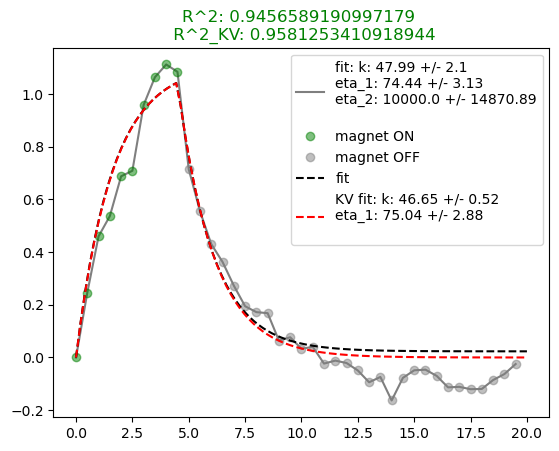

[53.07340721 84.36019784]


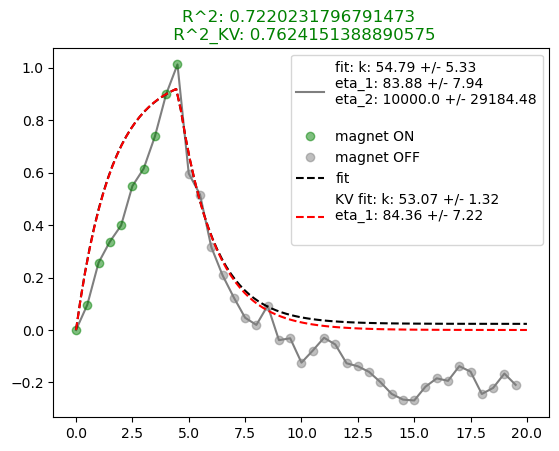

[ 30.15457097 101.64503485]


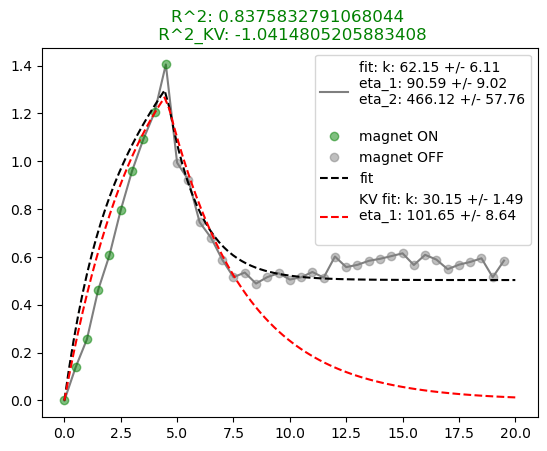

[ 5.4503546  76.41699677]


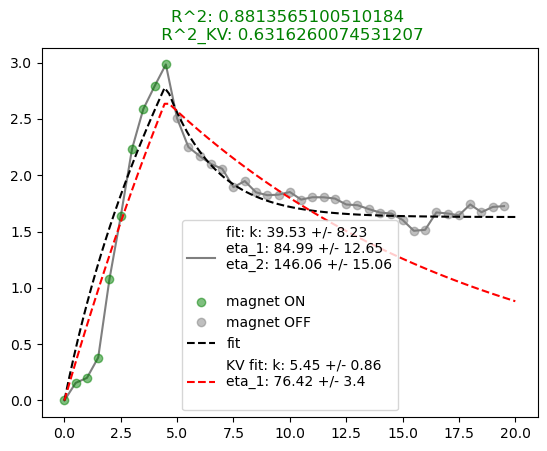

[48.93565772 92.71247053]


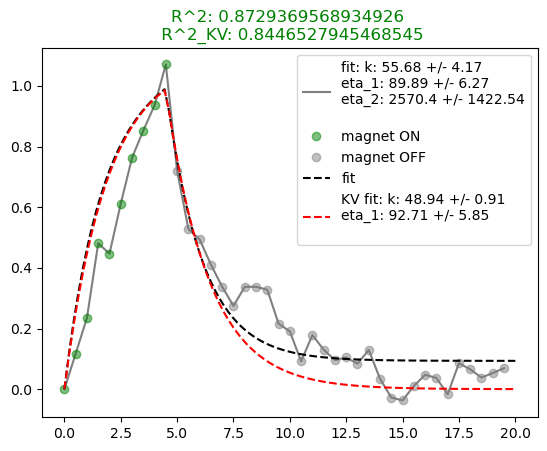

[ 54.50562454 127.13856208]


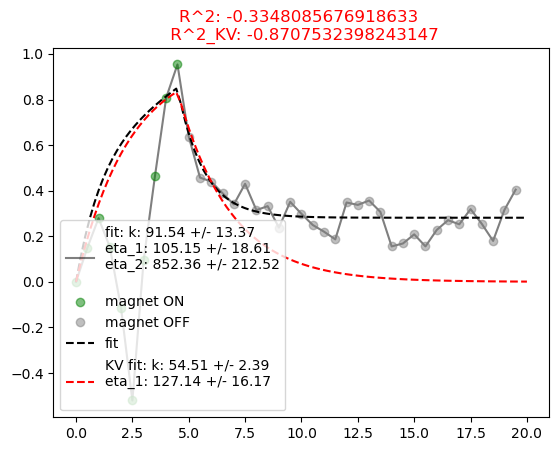

[51.51183813 71.80694791]


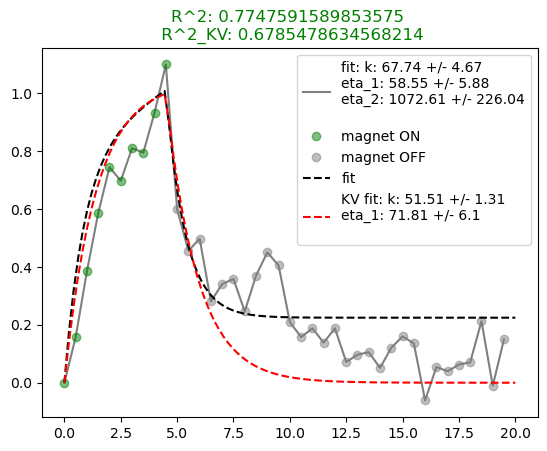

[40.30502734 59.5804193 ]


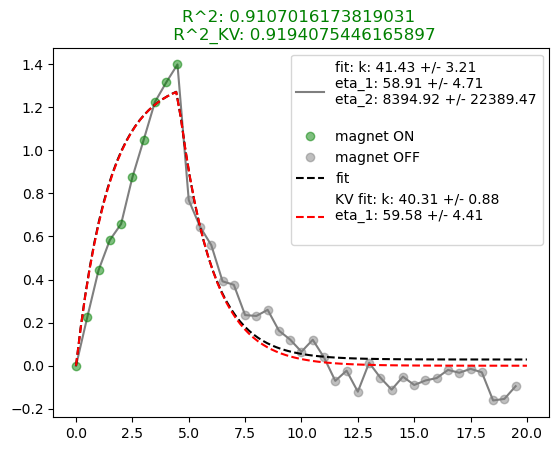

[32.18852598 63.17893374]


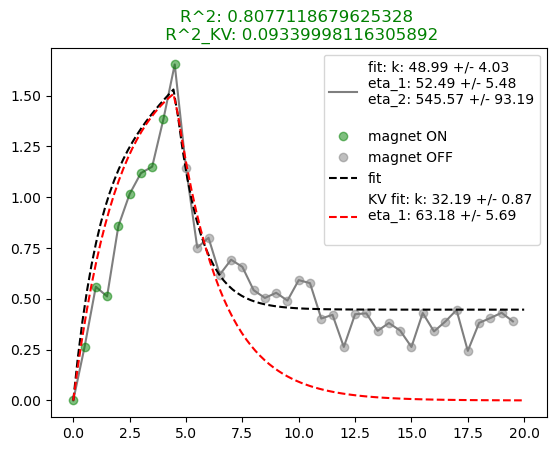

[28.29954514 65.94649892]


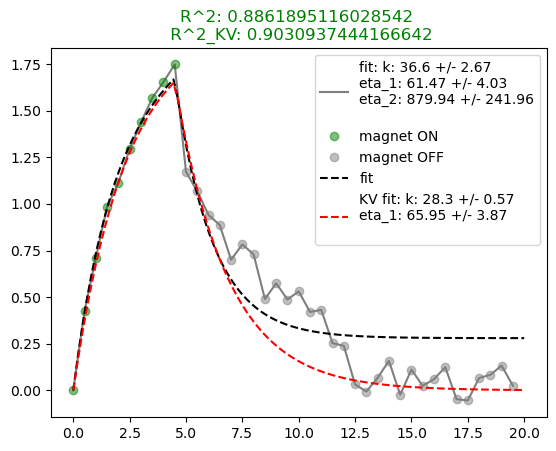

[24.67469857 57.23765392]


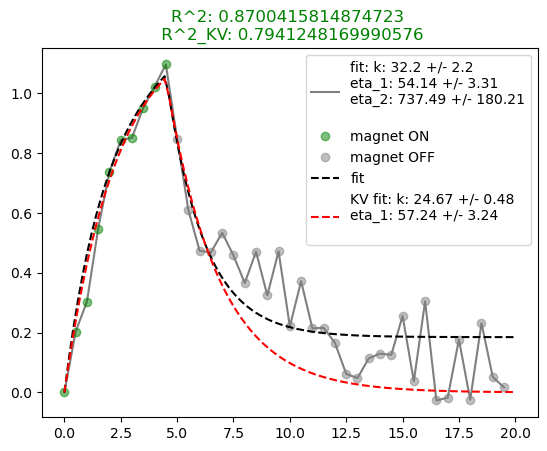

[18.76280029 34.65942886]


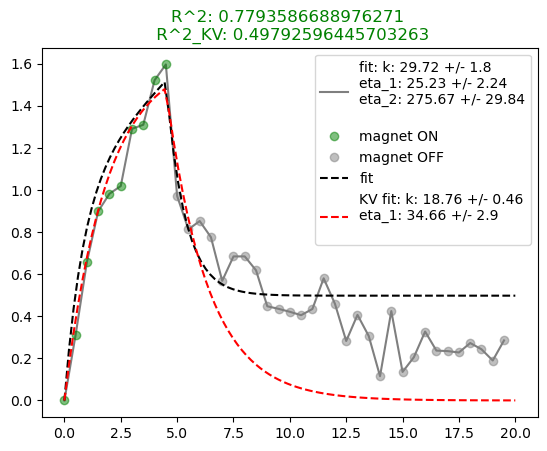

[10.86740837 37.26753976]


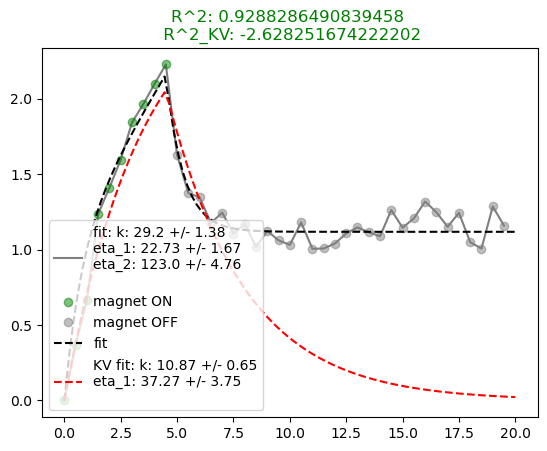

[19.0791843  54.06963599]


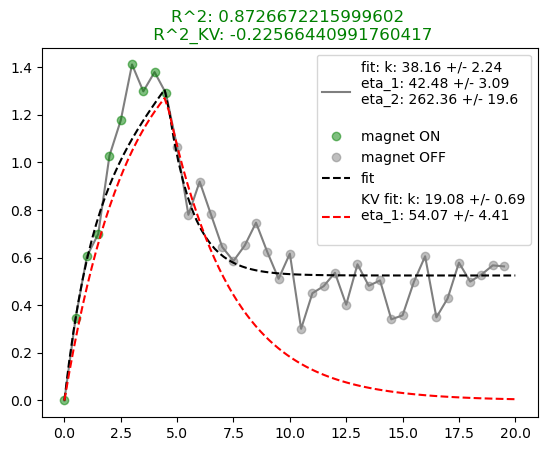

[14.03312672 47.02904866]


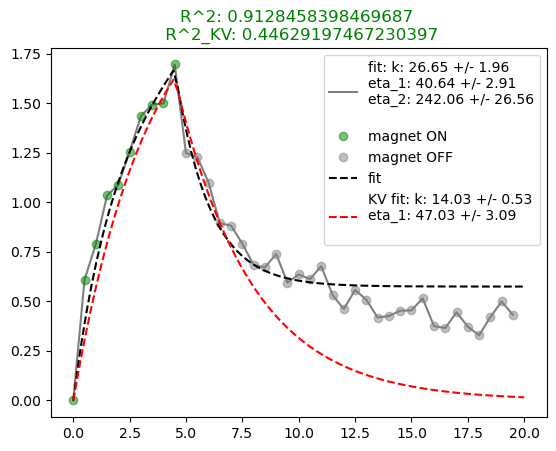

[38.11328695 48.34717647]


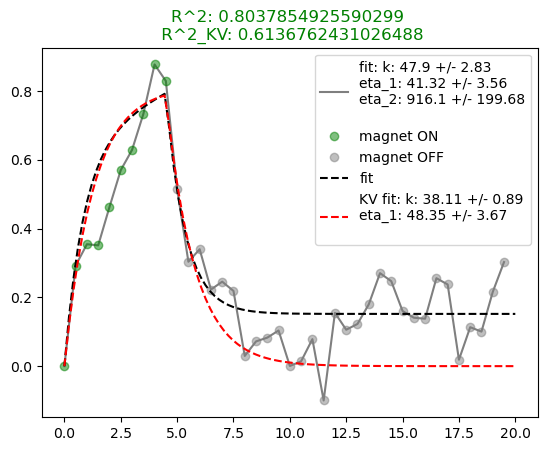

[46.75608247 61.27588418]


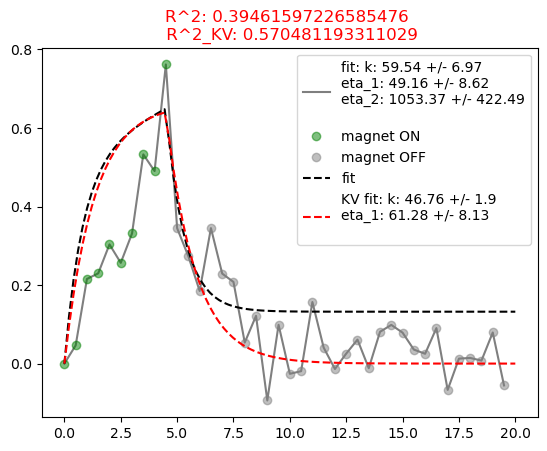

[25.90652922 42.51815903]


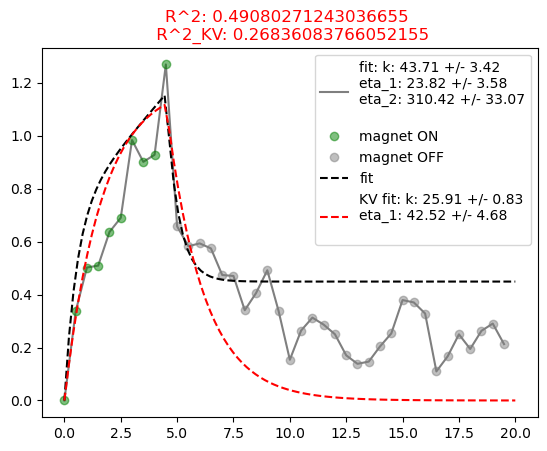

[17.80411817 39.76634191]


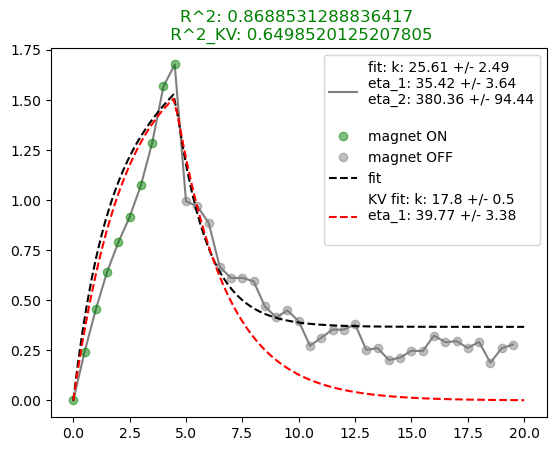

[17.03080267 57.49890165]


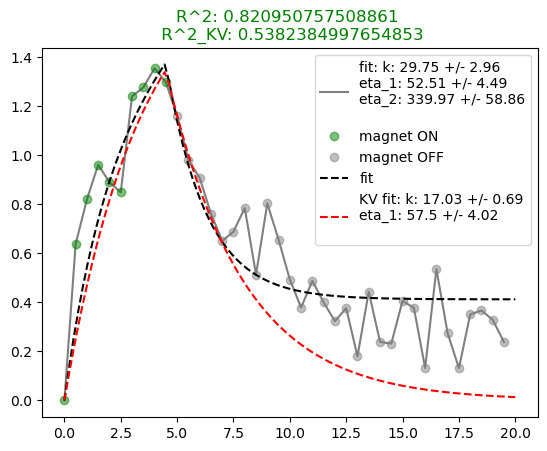

[20.58821086 58.38557283]


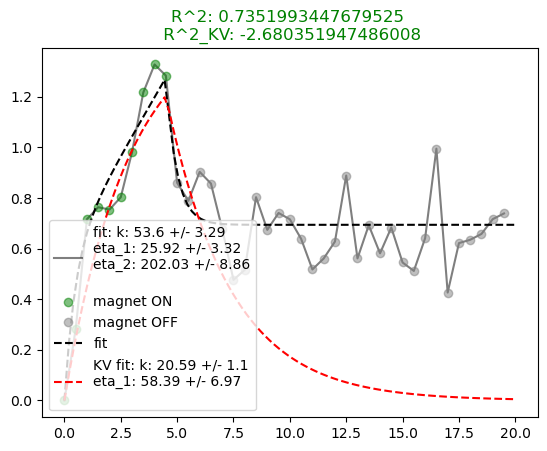

[17.76962199 60.65898106]


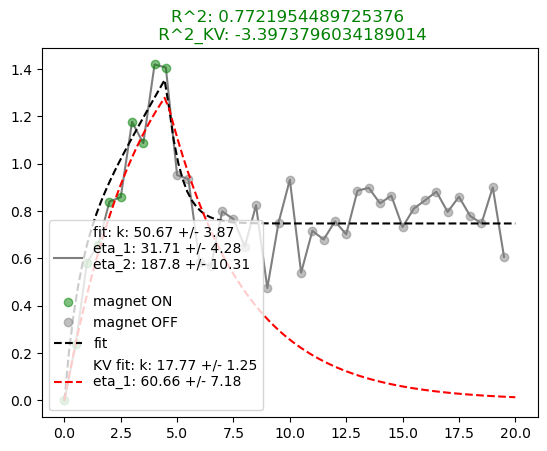

[ 1.41062601 34.57384549]


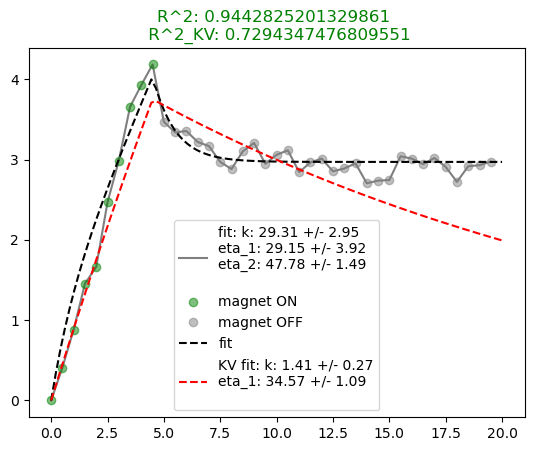

[22.80036231 34.91387884]


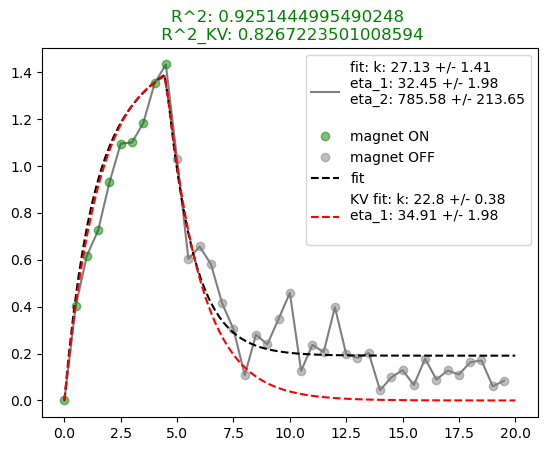

[23.78530122 59.98762283]


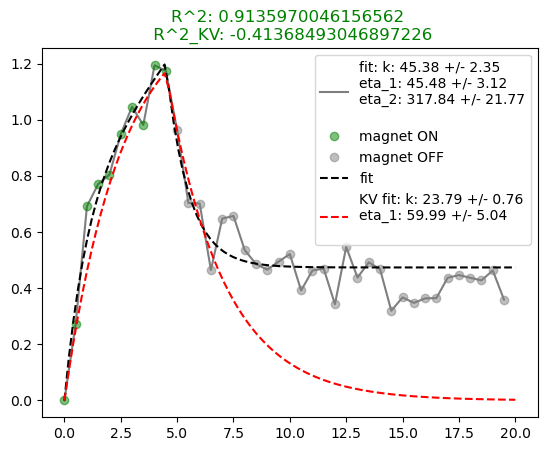

[  8.46233764 119.86926945]


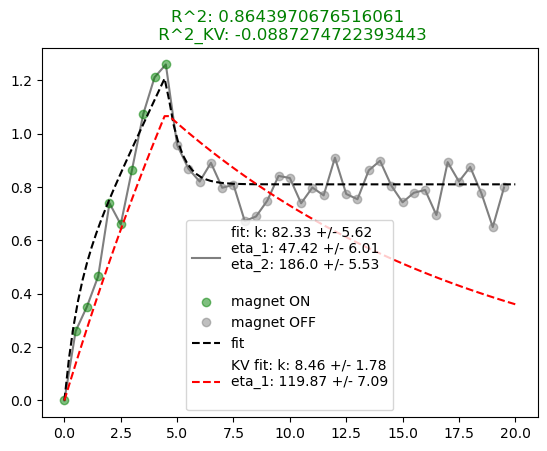

[26.49953574 76.10248802]


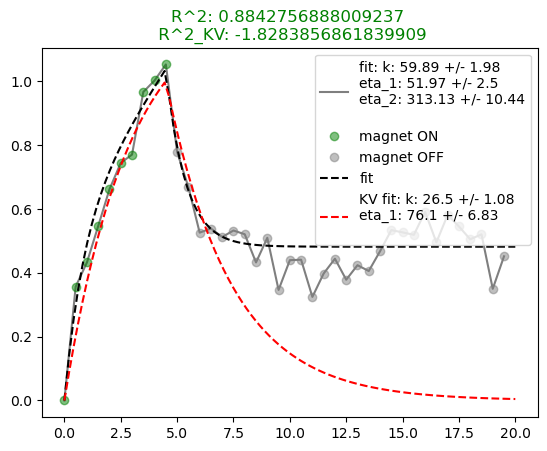

[37.931809   69.78889614]


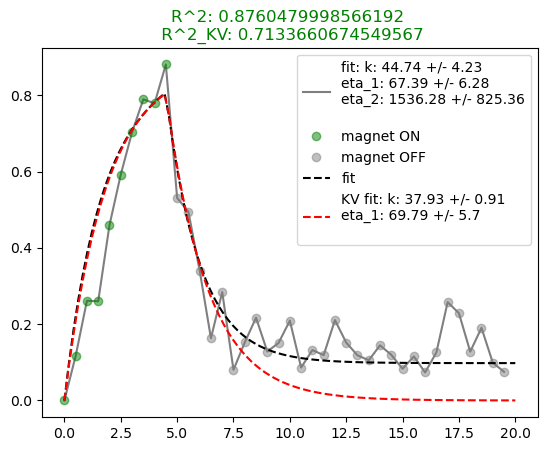

[45.59150448 75.7019399 ]


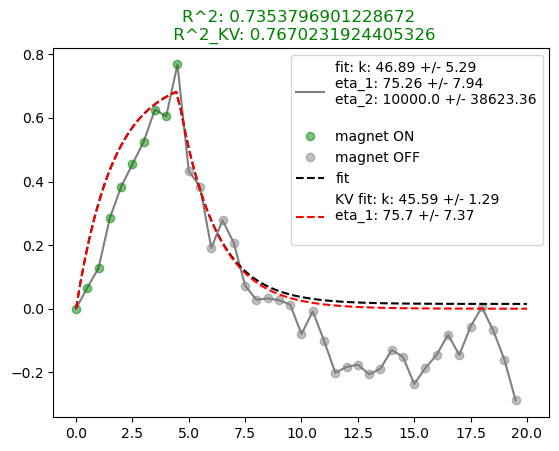

[21.07717532 57.10204497]


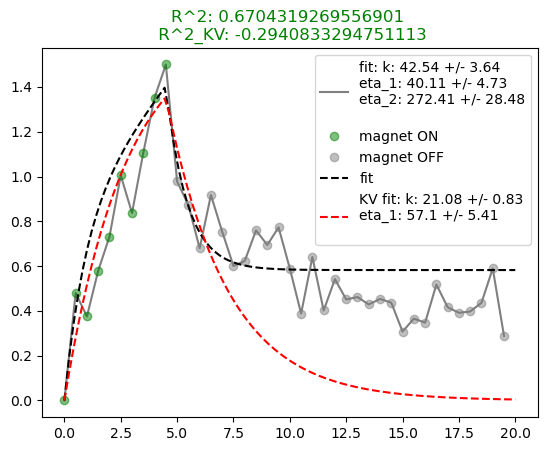

[ 1.66800844 63.20628277]


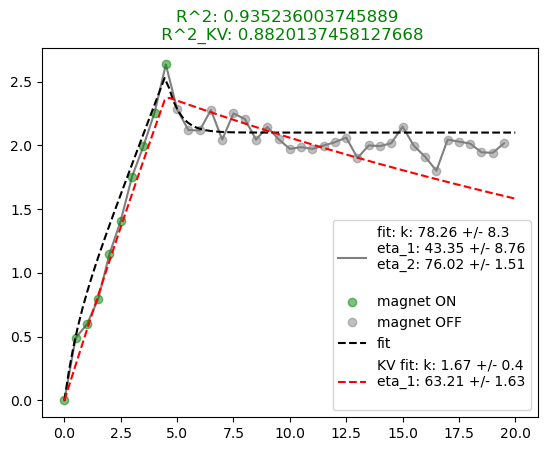

[ 1.42142837 41.37605374]


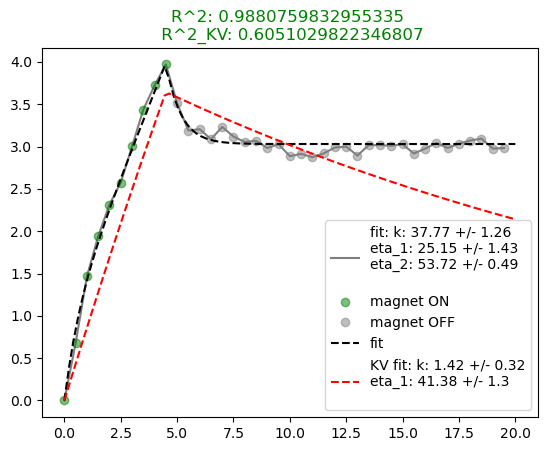

[ 7.5619407  81.15442858]


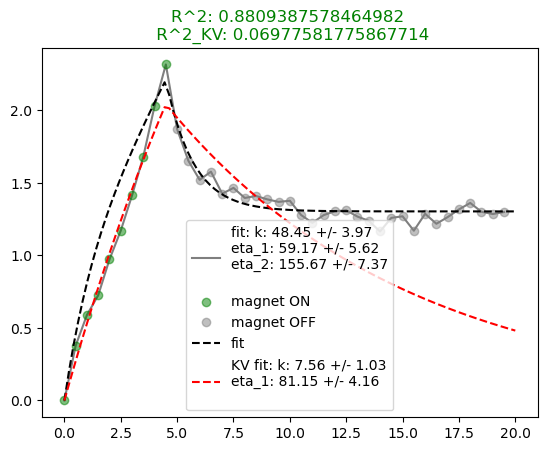

[15.98043958 66.96727835]


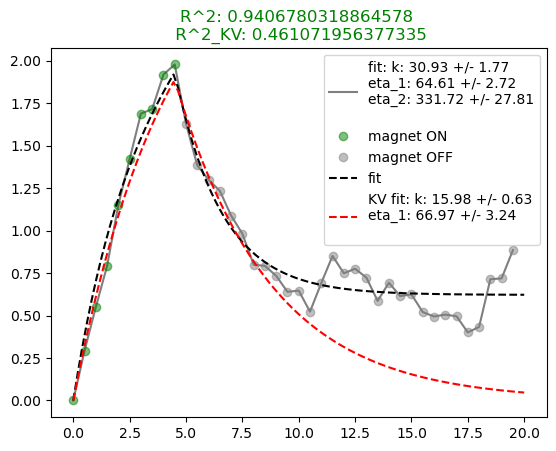

[19.6486656  68.91626453]


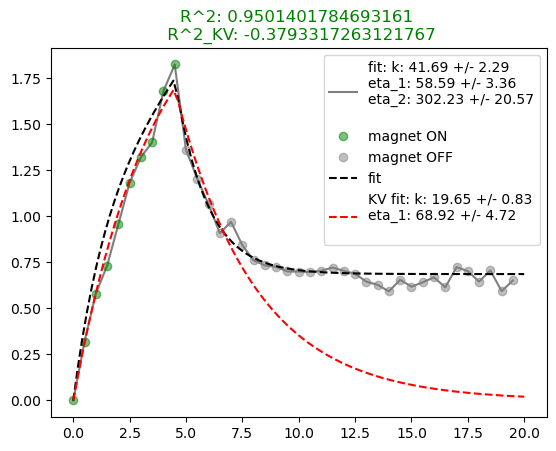

[27.93594583 55.41716002]


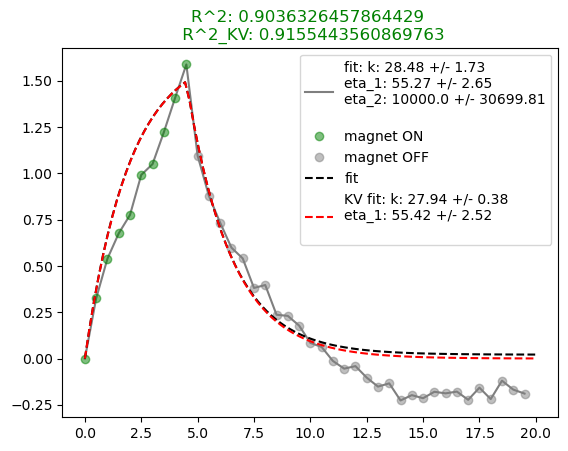

[ 2.24204934 55.26067503]


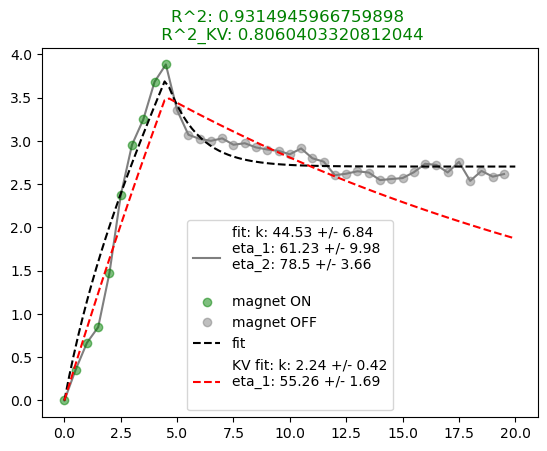

[ 2.29884626 48.79853274]


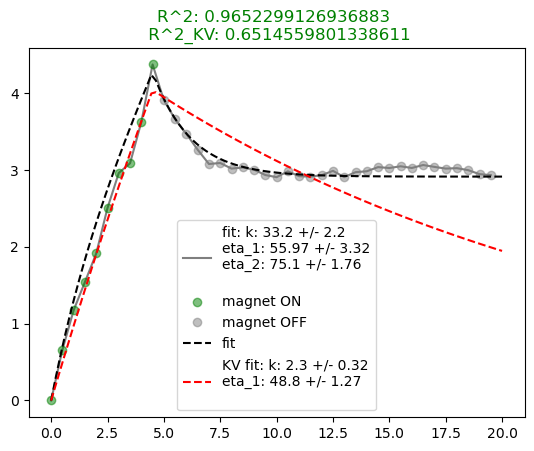

[21.932967   59.10699606]


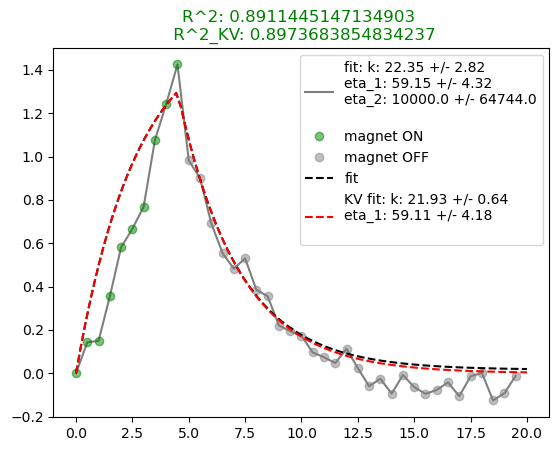

[21.53666005 45.76213592]


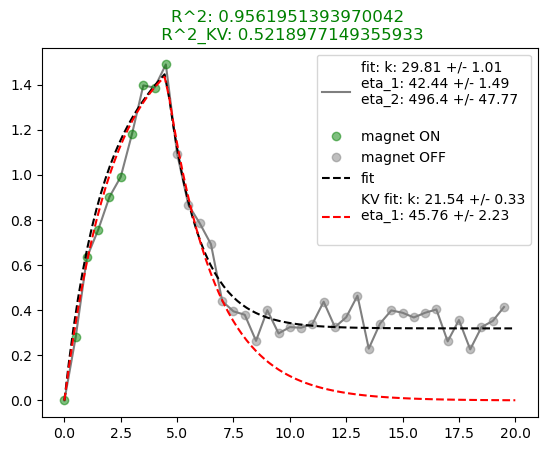

[20.1514928  55.73015236]


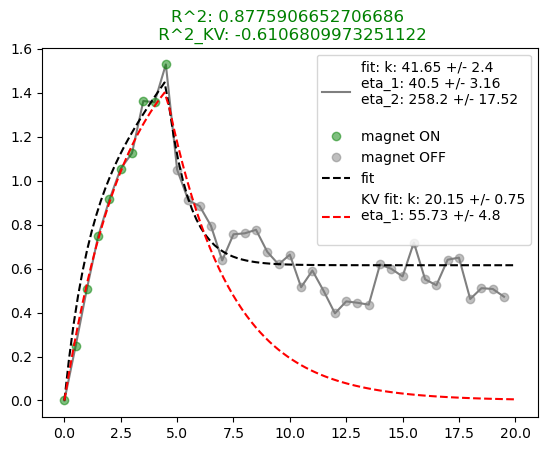

[ 4.13030509 52.13197735]


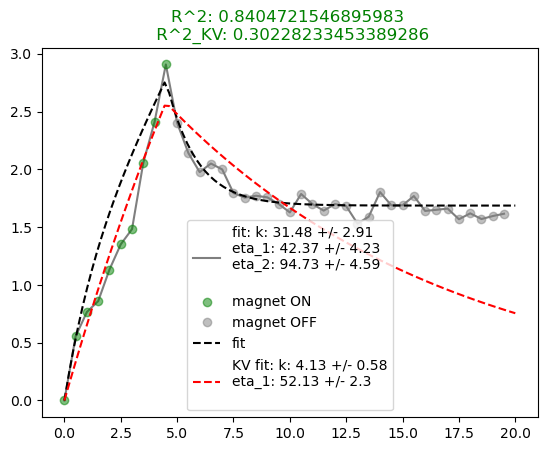

[ 0.83091391 33.71671969]


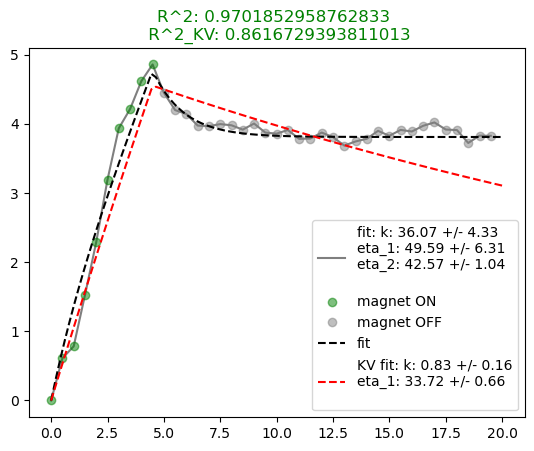

[13.95688567 55.29718465]


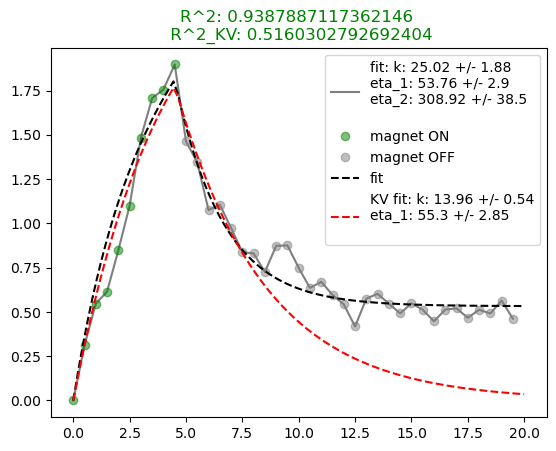

[11.76434798 45.28392211]


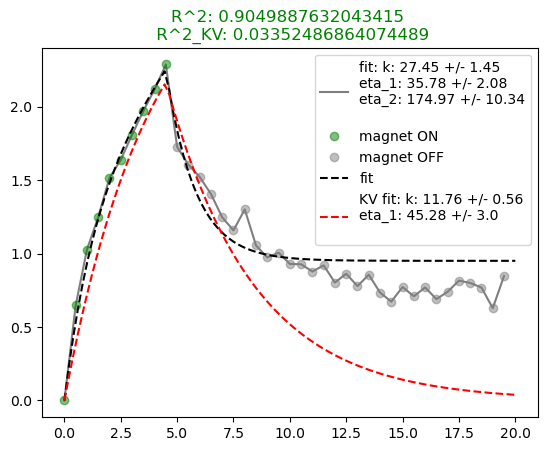

[18.8437712  37.95157674]


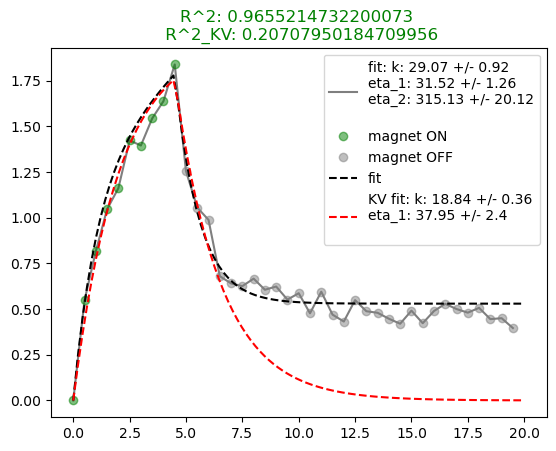

[15.53203241 42.46045938]


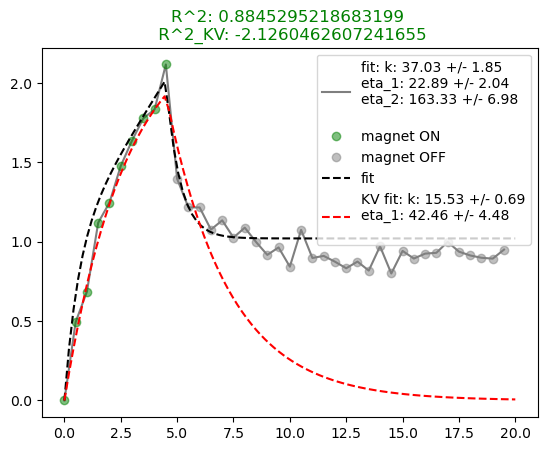

[ 3.97597071 70.84811762]


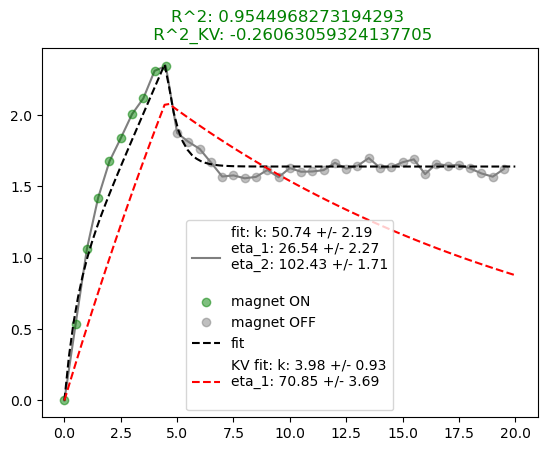

[21.60376783 61.79206682]


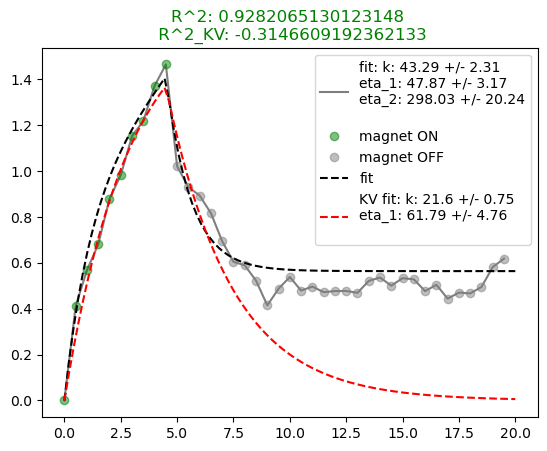

[14.55798568 51.74408671]


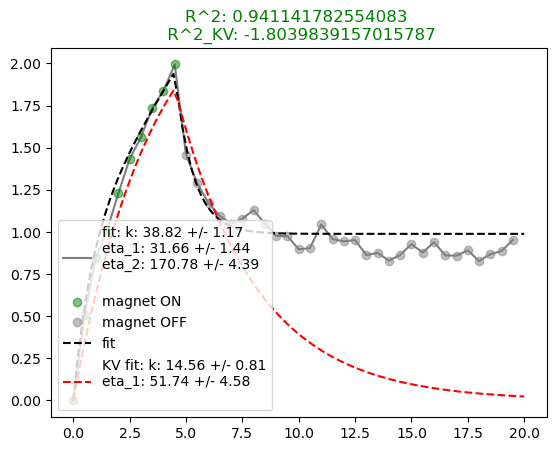

[10.30368528 56.29535348]


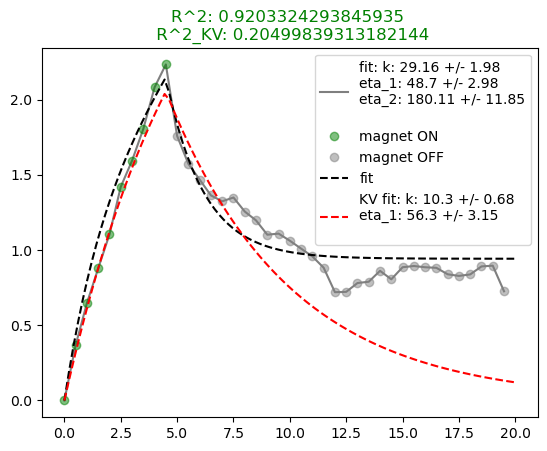

[16.96769303 84.58482133]


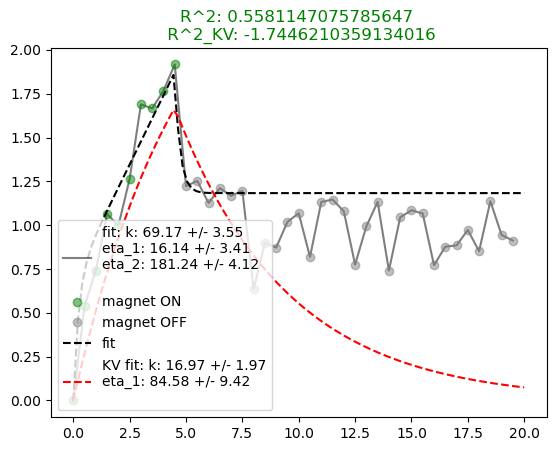

[ 1.98422648 43.04288286]


KeyboardInterrupt: 

In [5]:
folder = '/Volumes/cytokinesis-zebrafish-collab/magnetic_tweezers_SD/2_analysis/measurements_extended_info/'

df_results_jeff = pd.DataFrame(columns=['EMBRYO', 'TRACK_ID', 'PULSE_NUMBER', 'MT_STATUS', 'AVG_FORCE', 'k', 'eta_1', 'eta_2', 'a', 'k_err', 'eta_1_err', 'eta_2_err', 'a_err', 'R_SQUARED'])
df_results_jeff_filtered = pd.DataFrame(columns=['EMBRYO', 'TRACK_ID', 'PULSE_NUMBER', 'MT_STATUS', 'k', 'eta_1', 'eta_2', 'k_err', 'eta_1_err', 'eta_2_err','R_SQUARED'])

R2_min = 0.5 # cutoff for the weird fits

count_failed = 0
for idx in range(len(df_general_info)):
    filepath = df_general_info['trackmate_file'].values[idx]
    dt = df_general_info['time_interval (s)'].unique()[0]
    t_on = df_general_info['t_on (frame)'].unique()[0]
    t_off = df_general_info['t_off (frame)'].unique()[0]
    filename = os.path.basename(filepath).split('.')[0]
    print(filename)
    file_h5 = f'{filename}_extended.h5'
    comments = df_general_info['comments'].values[idx]

    df = pd.read_hdf(folder + file_h5, key='df')
    df = df.sort_values(by='POSITION_T')

    # plot curves
    
    for track_id in df['TRACK_ID'].unique():
        track = df[df['TRACK_ID']==track_id]
        track = track.dropna(subset=['CORRECTED DISPLACEMENT [um]'])
        for pulse_n in track['PULSE_NUMBER'].unique():
            pulse = track[track['PULSE_NUMBER']==pulse_n]
            time_on = pulse.loc[pulse['MAGNET_STATUS']==1, 'FRAME'].values * dt
            time_off = pulse.loc[pulse['MAGNET_STATUS']==0, 'FRAME'].values * dt
            time_off -= time_on[0]
            time_on -= time_on[0]
            time_data = list(time_on) + list(time_off)
            
            displacement_force_magnet_on = pulse.loc[pulse['MAGNET_STATUS']==1, 'CORRECTED DISPLACEMENT [um]'].values
            displacement_force_magnet_off = pulse.loc[pulse['MAGNET_STATUS']==0, 'CORRECTED DISPLACEMENT [um]'].values
            displacement_force_data = list(displacement_force_magnet_on) + list(displacement_force_magnet_off)

            avg_force = np.average(pulse.loc[pulse['MAGNET_STATUS']==1, 'FORCE [pN]'].values)
            # print('avg force:')
            # print(avg_force)

            t_1 = (t_on - 1) * dt
            if displacement_force_data[(t_on)] > displacement_force_data[(t_on - 1)]:
                t_1 = t_on * dt

            sigma = np.ones_like(displacement_force_data)
            sigma[:4] = 0.3
            window = 8
            sigma[t_on - int(window//4):t_on + int(3*window//4)] = 0.3*np.ones(window//4 + int(3*window//4))
            sigma[t_on-1:t_on+2] = 0.1*np.ones(3)

            time_fit = np.linspace(0, (t_on + t_off) * dt, 100)
            displacement_force_fit, popt, pcov = get_fit_jeff_full(time_fit, time_data, displacement_force_data, avg_force, t_1, sigma)


            displacement_force_fit_KV, popt_KV, pcov_KV = get_fit_KV_full(time_fit, time_data, displacement_force_data, avg_force, t_1, sigma)

            if np.any(popt) == False:
                count_failed += 1
                continue
            params = ['k', 'eta_1', 'eta_2']
            text = ''
            for i in range(len(popt)):
                text += f"{params[i]}: {round(popt[i], 2)} +/- {round(np.sqrt(pcov[i][i]), 2)}\n"
            text_KV = ''
            for i in range(len(popt_KV)):
                text_KV += f"{params[i]}: {round(popt_KV[i], 2)} +/- {round(np.sqrt(pcov_KV[i][i]), 2)}\n"

            k, eta_1, eta_2 = popt
            k_KV, eta_KV = popt_KV
            print(popt_KV)
            k_err, eta_1_err, eta_2_err = [np.sqrt(pcov[0][0]), np.sqrt(pcov[1][1]), np.sqrt(pcov[2][2])]
            # print(k, eta_1, eta_2)

            yfit = jeff_full(np.array(time_data), k, eta_1, eta_2, avg_force, t_1)
            yfit_KV = KV_full(np.array(time_data), k_KV, eta_KV, avg_force, t_1)
            R_sq = r_squared(np.array(displacement_force_data), np.array(yfit))
            R_sq_KV = r_squared(np.array(displacement_force_data), np.array(yfit_KV))
            # print('R squared: ', R_sq) 

            new_line = {'EMBRYO': [filename.split('_')[0]+filename.split('_')[1][0:6]], 
                        'TRACK_ID': track_id, 
                        'PULSE_NUMBER': pulse_n, 
                        'MT_STATUS': pulse['MT_STATUS'].unique(), 
                        'AVG_FORCE': avg_force,
                        'k': k, 
                        'eta_1': eta_1, 
                        'eta_2': eta_2, 
                        'k_err': k_err, 
                        'eta_1_err': eta_1_err, 
                        'eta_2_err': eta_2_err,
                        'R_SQUARED': R_sq}
            
            
            df_results_jeff = pd.concat([df_results_jeff, pd.DataFrame(new_line, index=[0])], ignore_index=True)

            # filter_conditions = ((R_sq > R2_min) & (k_err/k < 0.5) & (eta_1_err/eta_1 < 0.5) & (eta_2_err/eta_2 < 0.5)) & (eta_2 < 1000) & (eta_1 > 2)
            filter_conditions = (R_sq > R2_min)

            if True:
                pass
                plt.plot(time_data, displacement_force_data, 'k-', alpha = 0.5, label=f'fit: {text}')
                plt.plot(time_on, displacement_force_magnet_on, 'o', color ='green', alpha=0.5, label = 'magnet ON')
                plt.plot(time_off, displacement_force_magnet_off, 'o', color='gray', alpha=0.5, label = 'magnet OFF')
                plt.plot(time_fit, displacement_force_fit, 'k--', label = 'fit')
                plt.plot(time_fit, displacement_force_fit_KV, 'r--', label = f'KV fit: {text_KV}')
                if filter_conditions:
                    plt.title(f'R^2: {R_sq} \n R^2_KV: {R_sq_KV}', color='green')
                else:
                    plt.title(f'R^2: {R_sq} \n R^2_KV: {R_sq_KV}', color='red')
                plt.legend()
                plt.legend()
                plt.show()

            if not filter_conditions:
                count_failed +=1
                
            if filter_conditions:
                df_results_jeff_filtered = pd.concat([df_results_jeff_filtered, pd.DataFrame(new_line, index=[0])], ignore_index=True)

# calculate taur_r
df_results_jeff['tau_r'] = df_results_jeff['eta_1']/(2* df_results_jeff['k'])

# calculate a
df_results_jeff_filtered['a'] = 1 - 1 / ((df_results_jeff_filtered['eta_2'] / (df_results_jeff_filtered['k'] * t_1)) * (1- np.exp(- df_results_jeff_filtered['k']* t_1 / df_results_jeff_filtered['eta_1'])) +1)

# calculate taur_r
df_results_jeff_filtered['tau_r'] = df_results_jeff_filtered['eta_1']/(df_results_jeff_filtered['k'])


df_results_jeff_filtered = df_results_jeff_filtered.sort_values(by='EMBRYO', ascending=False)
df_results_jeff = df_results_jeff.sort_values(by='EMBRYO', ascending=False)

print(count_failed)

for embryo in df_results_jeff['EMBRYO'].unique():
    print(embryo)
    print(df_results_jeff.loc[df_results_jeff['EMBRYO']==embryo, 'MT_STATUS'].unique())


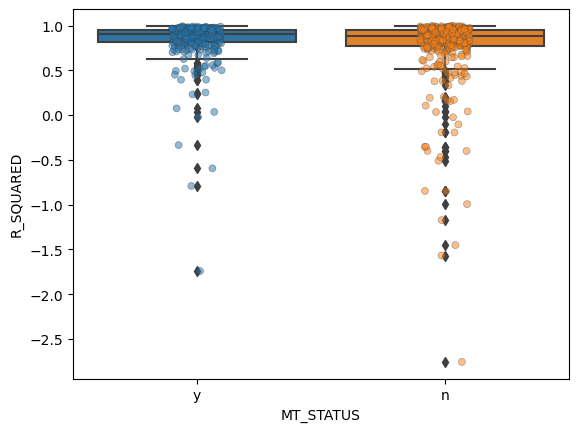

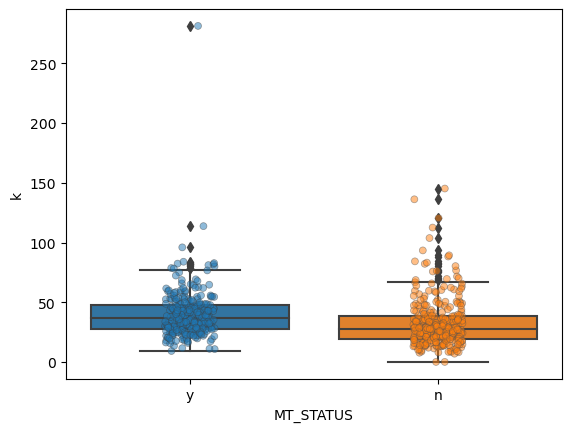

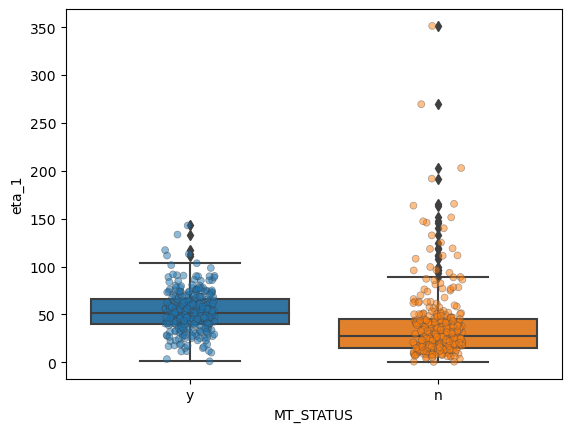

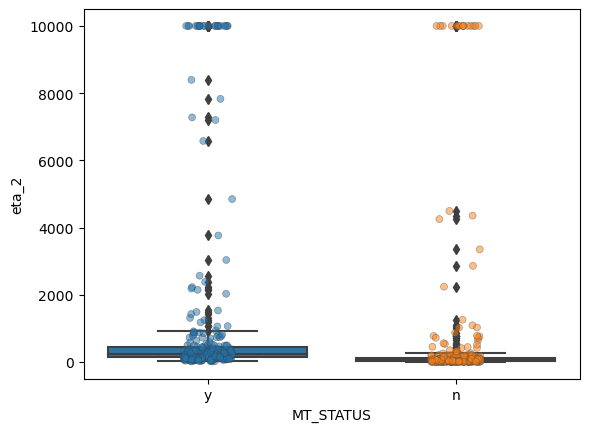

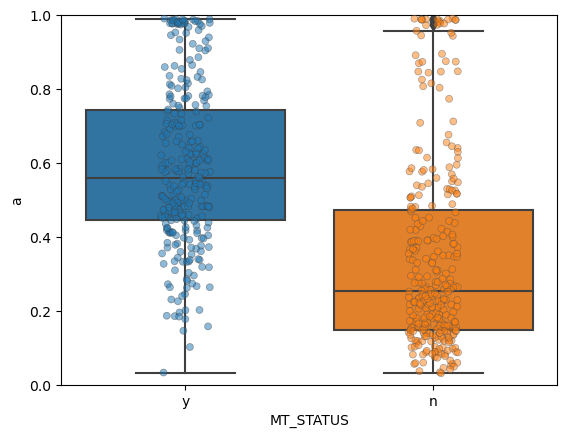

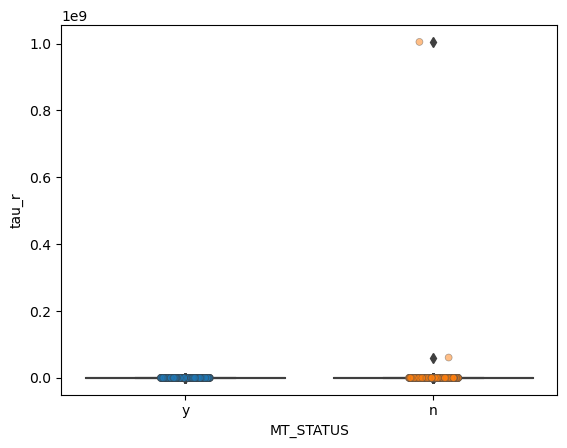

Total N = 654
Filtered N = 600
Total N (MT=y)= 306
Filtered N (MT=y) = 254
Filtered N / Total N (MT=y) = 0.8300653594771242
Total N (MT=n)= 348
Filtered N (MT=n) = 346
Filtered N / Total N (MT=n) = 0.9942528735632183


/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_12985/1272685377.py:42: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  N_filtered_MT = len(df_results_jeff_filtered[df_results_jeff['MT_STATUS']=='y'])
/var/folders/c1/95zwm3_14_j1wp412s49dvlr0000gp/T/ipykernel_12985/1272685377.py:48: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  N_filtered_noMT = len(df_results_jeff_filtered[df_results_jeff['MT_STATUS']=='n'])


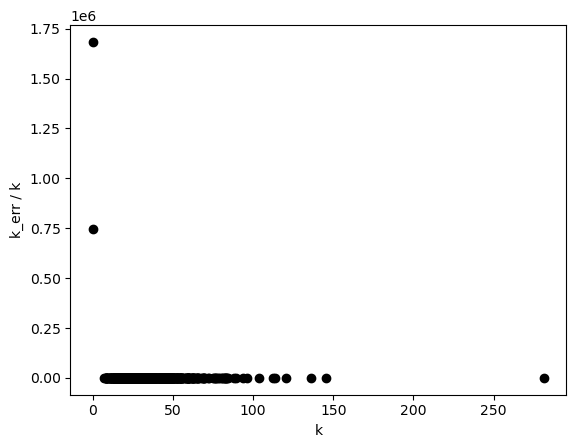

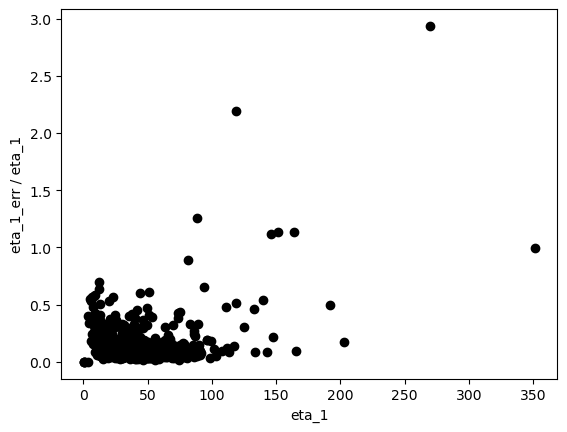

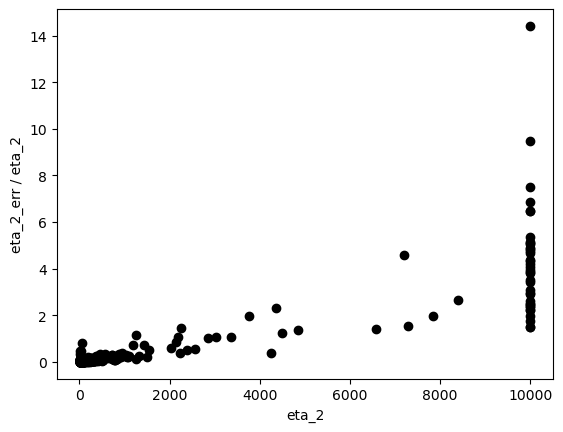

In [ ]:
# Second subplot: Summary statistics
sns.boxplot(x='MT_STATUS', y='R_SQUARED', data=df_results_jeff)
sns.stripplot(x='MT_STATUS', y='R_SQUARED', hue='MT_STATUS', dodge=False, data=df_results_jeff, jitter=True, alpha=0.5, linewidth=0.5, legend=False)
plt.show()


# Second subplot: Summary statistics
sns.boxplot(x='MT_STATUS', y='k', data=df_results_jeff_filtered)
sns.stripplot(x='MT_STATUS', y='k', hue='MT_STATUS', dodge=False, data=df_results_jeff_filtered, jitter=True, alpha=0.5, linewidth=0.5, legend=False)
# plt.ylim(0, 100)
plt.show()

# boxplot
sns.boxplot(x='MT_STATUS', y='eta_1', data=df_results_jeff_filtered)
sns.stripplot(x='MT_STATUS', y='eta_1', hue='MT_STATUS', dodge=False, data=df_results_jeff_filtered, jitter=True, alpha=0.5, linewidth=0.5, legend=False)
# plt.ylim(0, 500)
plt.show()

# boxplot
sns.boxplot(x='MT_STATUS', y='eta_2', data=df_results_jeff_filtered)
sns.stripplot(x='MT_STATUS', y='eta_2', hue='MT_STATUS', dodge=False, data=df_results_jeff_filtered, jitter=True, alpha=0.5, linewidth=0.5, legend=False)
# plt.ylim(0, 100)
plt.show()

# boxplot
sns.boxplot(x='MT_STATUS', y='a', data=df_results_jeff_filtered)
sns.stripplot(x='MT_STATUS', y='a', hue='MT_STATUS', dodge=False, data=df_results_jeff_filtered, jitter=True, alpha=0.5, linewidth=0.5, legend=False)
plt.ylim(0, 1)
plt.show()

# boxplot
sns.boxplot(x='MT_STATUS', y='tau_r', data=df_results_jeff_filtered)
sns.stripplot(x='MT_STATUS', y='tau_r', hue='MT_STATUS', dodge=False, data=df_results_jeff_filtered, jitter=True, alpha=0.5, linewidth=0.5, legend=False)
# plt.ylim(0, 10)
plt.show()


print(f'Total N = {len(df_results_jeff)}')
print(f'Filtered N = {len(df_results_jeff_filtered)}')

N_all_MT = len(df_results_jeff[df_results_jeff['MT_STATUS']=='y'])
N_filtered_MT = len(df_results_jeff_filtered[df_results_jeff['MT_STATUS']=='y'])
print(f'Total N (MT=y)= {N_all_MT}')
print(f'Filtered N (MT=y) = {N_filtered_MT}')
print(f'Filtered N / Total N (MT=y) = {N_filtered_MT/N_all_MT}')

N_all_noMT = len(df_results_jeff[df_results_jeff['MT_STATUS']=='n'])
N_filtered_noMT = len(df_results_jeff_filtered[df_results_jeff['MT_STATUS']=='n'])
print(f'Total N (MT=n)= {N_all_noMT}')
print(f'Filtered N (MT=n) = {N_filtered_noMT}')
print(f'Filtered N / Total N (MT=n) = {N_filtered_noMT/N_all_noMT}')



plt.plot(df_results_jeff_filtered['k'], df_results_jeff_filtered['k_err']/df_results_jeff_filtered['k'], 'ko')
plt.xlabel('k')
plt.ylabel('k_err / k')
plt.show()
plt.plot(df_results_jeff_filtered['eta_1'], df_results_jeff_filtered['eta_1_err']/df_results_jeff_filtered['eta_1'], 'ko')
plt.xlabel('eta_1')
plt.ylabel('eta_1_err / eta_1')
plt.show()
plt.plot(df_results_jeff_filtered['eta_2'], df_results_jeff_filtered['eta_2_err']/df_results_jeff_filtered['eta_2'], 'ko')
plt.xlabel('eta_2')
plt.ylabel('eta_2_err / eta_2')
plt.show()

In [ ]:
# Define the mapping
mapping = {'y': 'Interphase', 'n': 'M-phase'}

# Create a new column based on the mapping
df_results_jeff_filtered['Phase'] = df_results_jeff_filtered['MT_STATUS'].map(mapping)
df_results_jeff_filtered.to_csv(f'{results_dir}results/results_jeffreys_model_filtered.csv')


df_median_stats = pd.DataFrame(columns=['mean', 'std', 'median', 'q1', 'q3', 'parameter'])

for (param, label) in zip(params + ['a', 'tau_r'], ['$\kappa$ (pN / $\mathrm{\\mu m}$)', '$\gamma_1$ (pN s/ $\mathrm{\\mu m}$)', '$\gamma_2$ (pN s/ $\mathrm{\\mu m}$)', 'Recovery a', 'Relaxation time $\\tau_R$ (s)']):

    df = df_results_jeff_filtered

    # Calculate statistics
    stats = df.groupby(['MT_STATUS', 'EMBRYO'])[param].agg(['mean', 'std', 'median', lambda x: np.percentile(x, 25), lambda x: np.percentile(x, 75)])
    stats.columns = ['mean', 'std', 'median', 'q1', 'q3']
    stats = stats.reset_index()
    stats = stats.sort_values(by='MT_STATUS', ascending=False)

    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(8, 6), dpi=300, sharey=True, gridspec_kw={'width_ratios': [3, 1]})

    # First subplot: Combined boxplot and stripplot
    sns.boxplot(ax=axes[0], x='EMBRYO', y=param, hue='Phase', data=df)
    sns.stripplot(ax=axes[0], x='EMBRYO', y=param, hue='Phase', dodge=True, data=df, jitter=True, alpha=0.5, linewidth=0.5, legend=False)
    axes[0].set_xticks(ticks=range(len(df['EMBRYO'].unique())))
    axes[0].set_xticklabels(labels=['s' + str(i+1) for i in range(len(df['EMBRYO'].unique()))], rotation=45, ha='right')
    axes[0].set_ylabel(label)
    axes[0].set_xlabel('Embryos')

    # Add custom legend to the first plot
    axes[0].legend(loc='upper left')
    axes[0].set_title('All data')

    # Second subplot: Summary statistics
    sns.boxplot(ax=axes[1], x='MT_STATUS', y='median', data=stats)
    sns.stripplot(ax=axes[1], x='MT_STATUS', y='median', hue='MT_STATUS', data=stats, jitter=True, alpha=0.5, linewidth=0.5, legend=False)
    axes[1].set_ylabel('')
    axes[1].set_xlabel('')
    axes[1].set_xticklabels(labels=['Interphase', 'M-phase'])
    axes[1].set_title(f'Median')

     # Calculate statistics
    stats_ = stats.drop(columns=['EMBRYO'])
    if save_to_server:
        stats_.to_csv(f'{results_dir}results/stats_{param}.csv')
    stats_of_stats = stats_[['MT_STATUS', 'median']].groupby(['MT_STATUS']).agg(['mean', 'std', 'median', lambda x: np.percentile(x, 25), lambda x: np.percentile(x, 75)])
    stats_of_stats.columns = ['mean', 'std', 'median', 'q1', 'q3']
    stats_of_stats['parameter'] = param
    stats_of_stats = stats_of_stats.reset_index()
    stats_of_stats = stats_of_stats.sort_values(by='MT_STATUS', ascending=False)
    print(stats_of_stats)
    
    df_median_stats = pd.concat([df_median_stats, stats_of_stats])

    for embryo in stats['EMBRYO'].unique():
        if len(stats.loc[stats['EMBRYO']==embryo, 'median'].values) == 2:
            axes[1].plot(['y', 'n'], stats.loc[stats['EMBRYO']==embryo, 'median'].values, 'k-', alpha = 0.5, linewidth=1)
    
    # if param.startswith('eta'):
    #     plt.ylim(top=400)
    plt.ylim(bottom=0)
    plt.tight_layout()
    if save_to_server:
        plt.savefig(f'{results_dir}results/result_{param}.svg', format='svg')
    plt.show()

if save_to_server:
    df_median_stats.to_csv(f'{results_dir}results/results_jeffreys_model_stats_of_median.csv')

NameError: name 'results_dir' is not defined

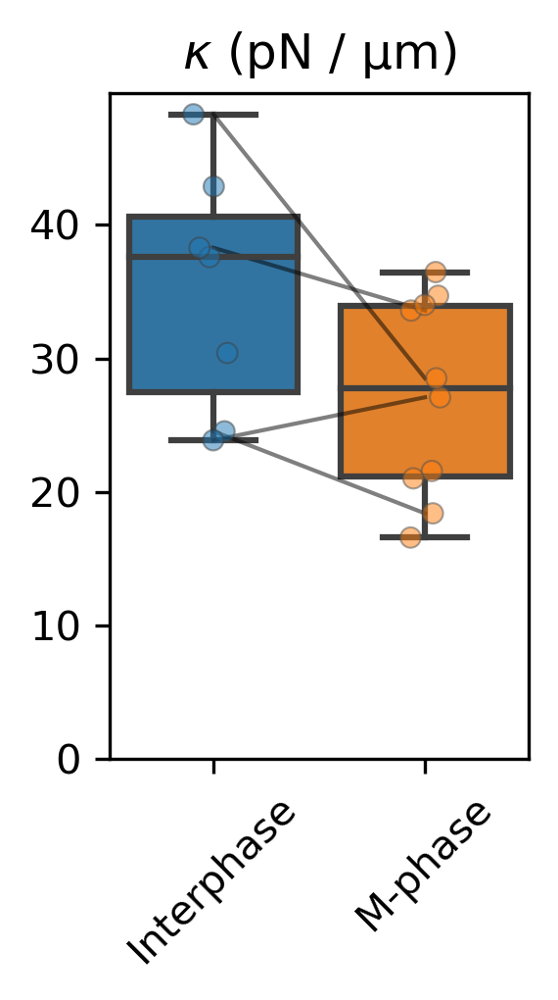

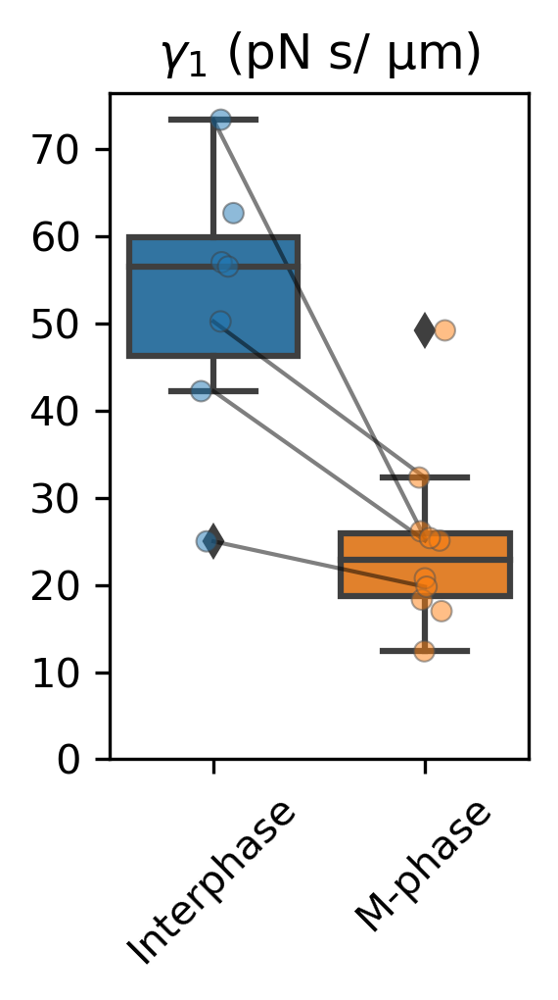

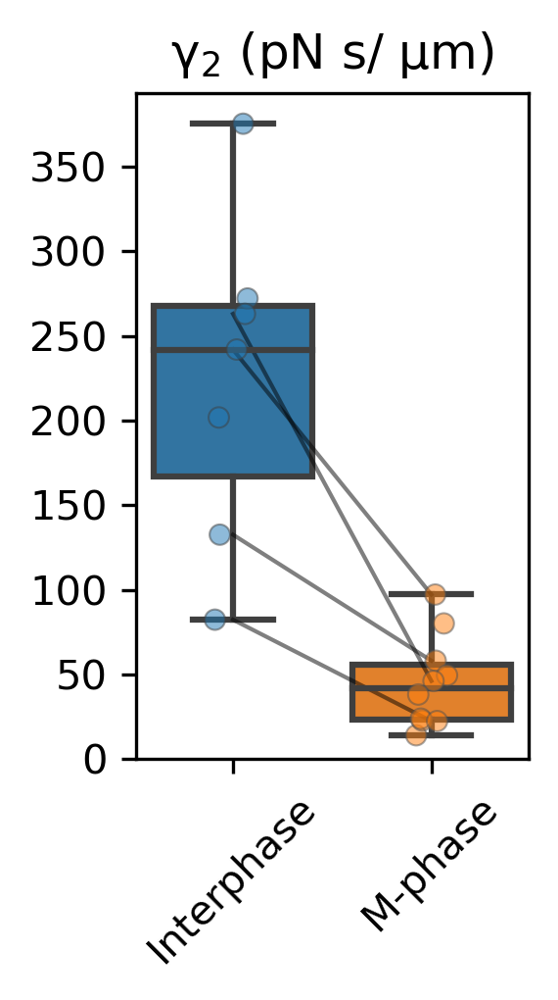

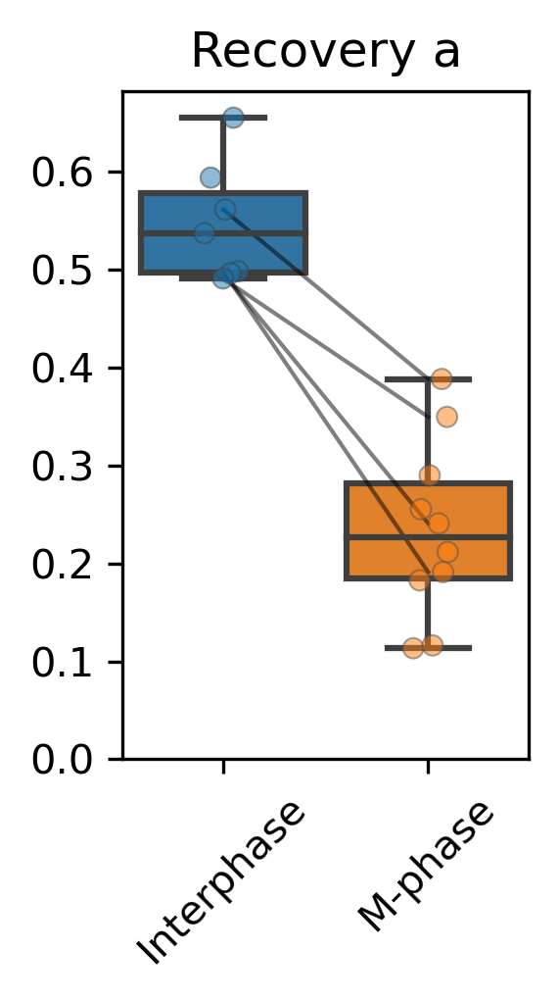

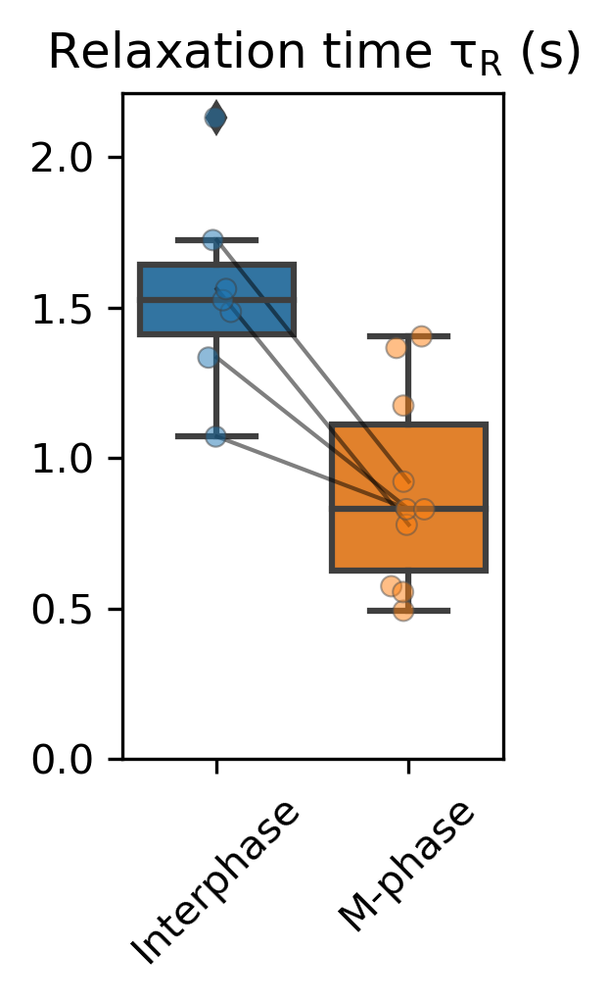

In [ ]:
# Define the mapping
mapping = {'y': 'Interphase', 'n': 'M-phase'}

# Create a new column based on the mapping
df_results_jeff_filtered['Phase'] = df_results_jeff_filtered['MT_STATUS'].map(mapping)


df_median_stats = pd.DataFrame(columns=['mean', 'std', 'median', 'q1', 'q3', 'parameter'])

for (param, label) in zip(params + ['a', 'tau_r'], ['$\kappa$ (pN / $\mathrm{\\mu m}$)', '$\gamma_1$ (pN s/ $\mathrm{\\mu m}$)', '$\mathrm{\gamma_2}$ (pN s/ $\mathrm{\\mu m}$)', 'Recovery a', 'Relaxation time $\mathrm{\\tau_R}$ (s)']):

    df = df_results_jeff_filtered

    # Calculate statistics
    stats = df.groupby(['MT_STATUS', 'EMBRYO'])[param].agg(['mean', 'std', 'median', lambda x: np.percentile(x, 25), lambda x: np.percentile(x, 75)])
    stats.columns = ['mean', 'std', 'median', 'q1', 'q3']
    stats = stats.reset_index()
    stats = stats.sort_values(by='MT_STATUS', ascending=False)

    # Create subplots
    fig = plt.figure(figsize=(2, 3.5), dpi=300)

    # Second subplot: Summary statistics
    sns.boxplot(x='MT_STATUS', y='median', data=stats)
    sns.stripplot(x='MT_STATUS', y='median', hue='MT_STATUS', data=stats, jitter=True, alpha=0.5, linewidth=0.5, legend=False)
    plt.title(f'{label}')
    plt.xlabel('')
    plt.ylabel('')
    plt.ylim(bottom=0)
    plt.xticks(ticks = ['y', 'n'], labels=['Interphase', 'M-phase'], rotation=45)

    for embryo in stats['EMBRYO'].unique():
        if len(stats.loc[stats['EMBRYO']==embryo, 'median'].values) == 2:
            plt.plot(['y', 'n'], stats.loc[stats['EMBRYO']==embryo, 'median'].values, 'k-', alpha = 0.5, linewidth=1)
            
    plt.tight_layout()
    if save_to_server:
        plt.savefig(f'{results_dir}results/result_{param}_median.svg', format='svg')
        
    plt.show()

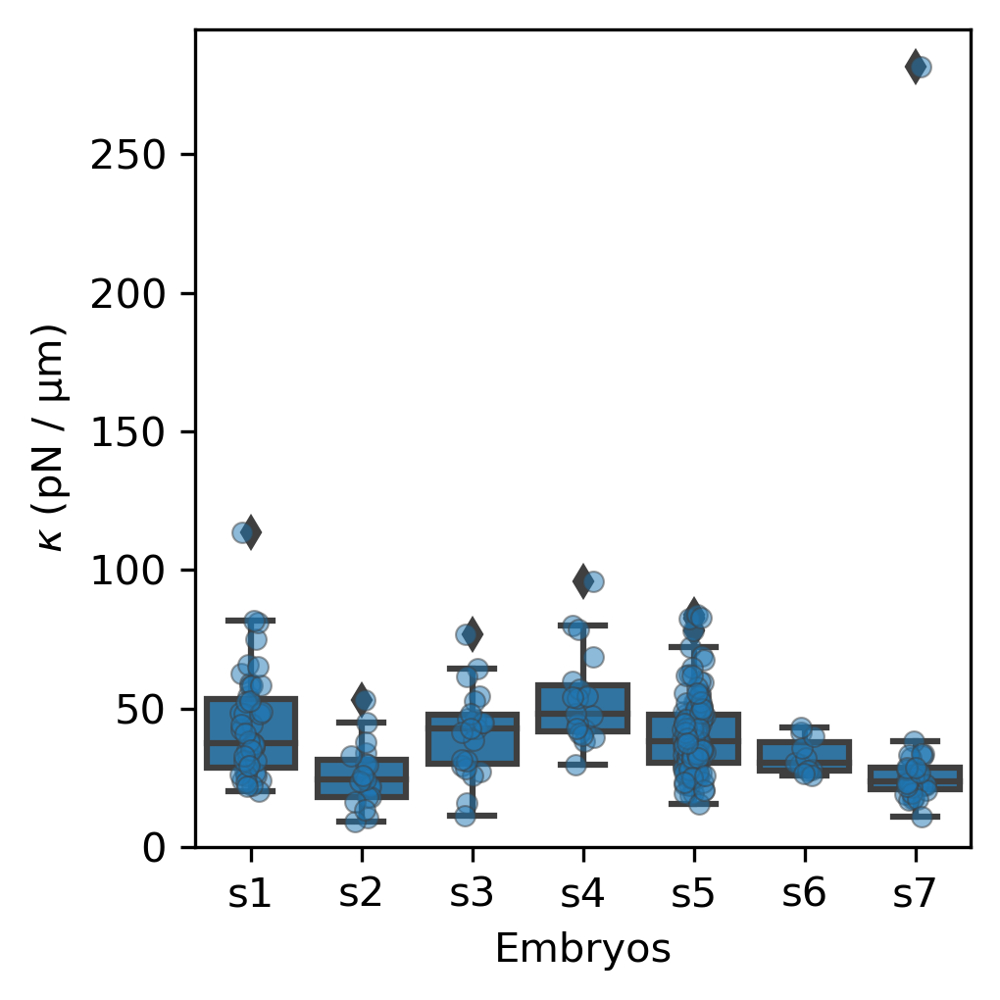

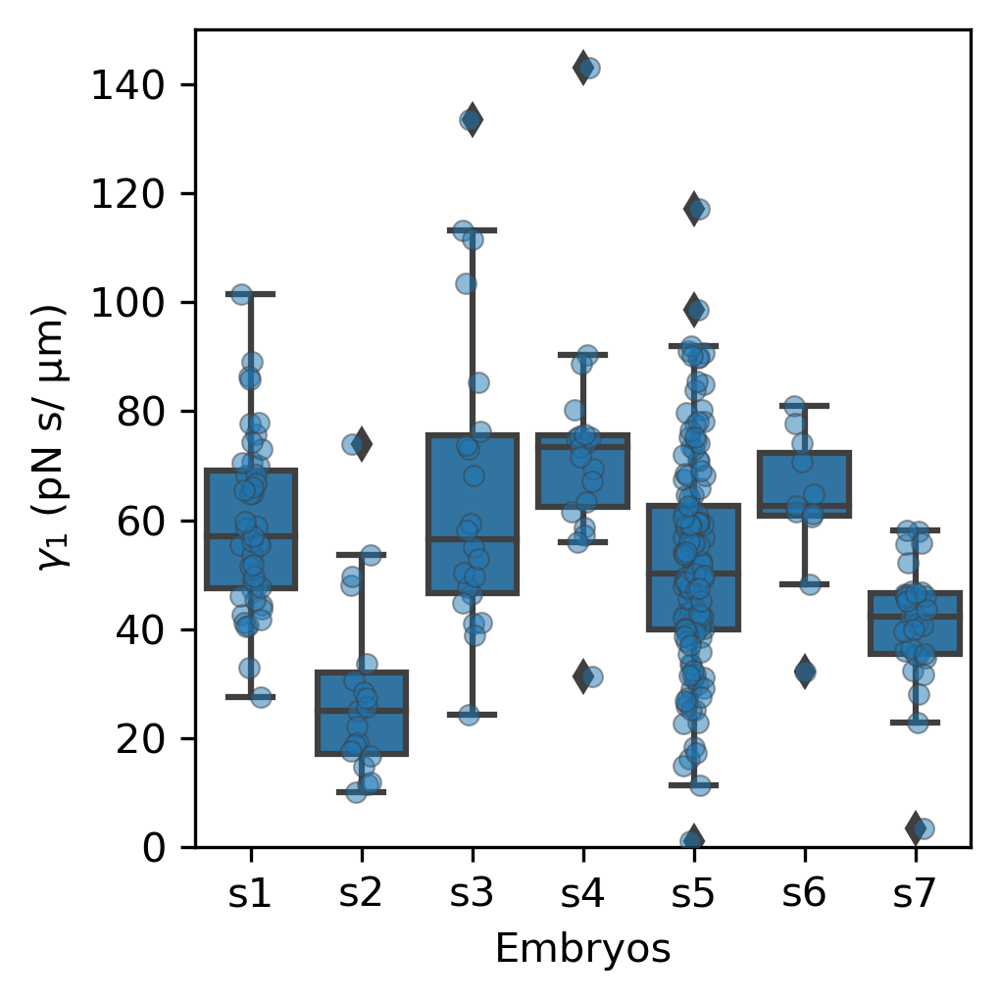

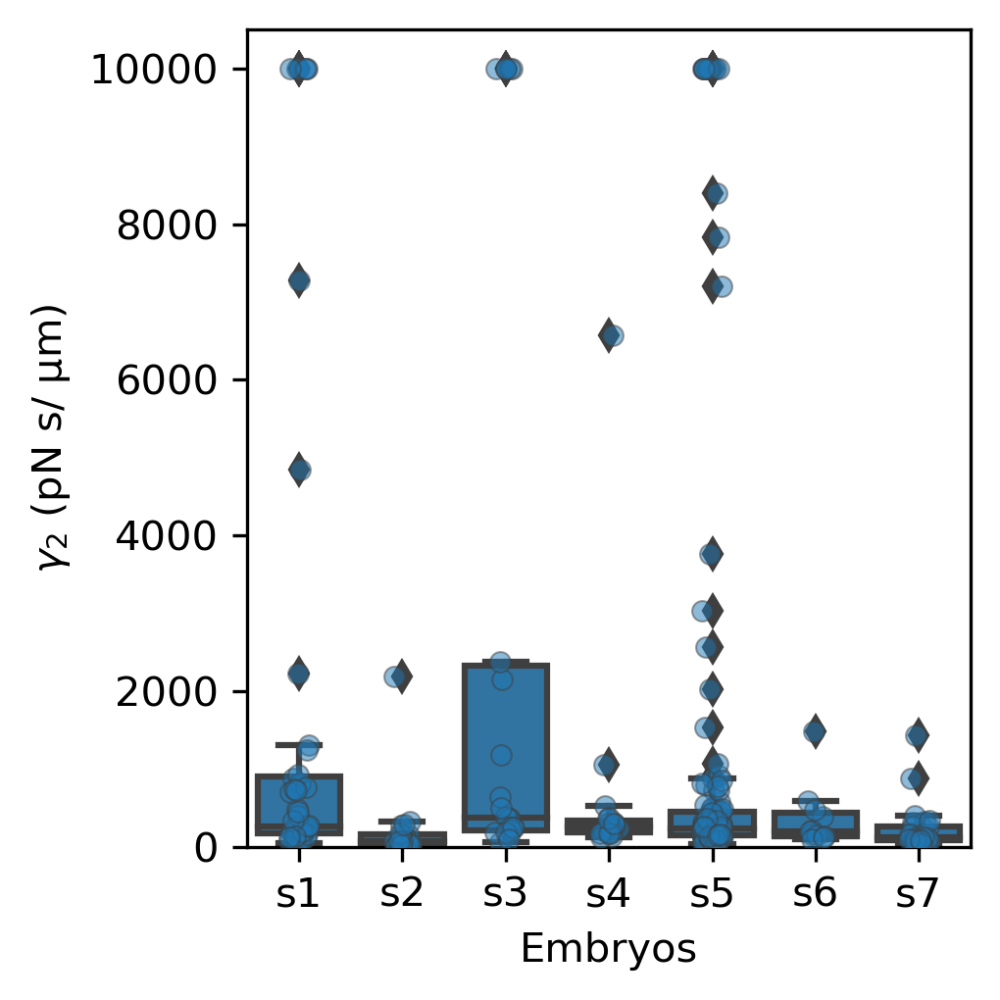

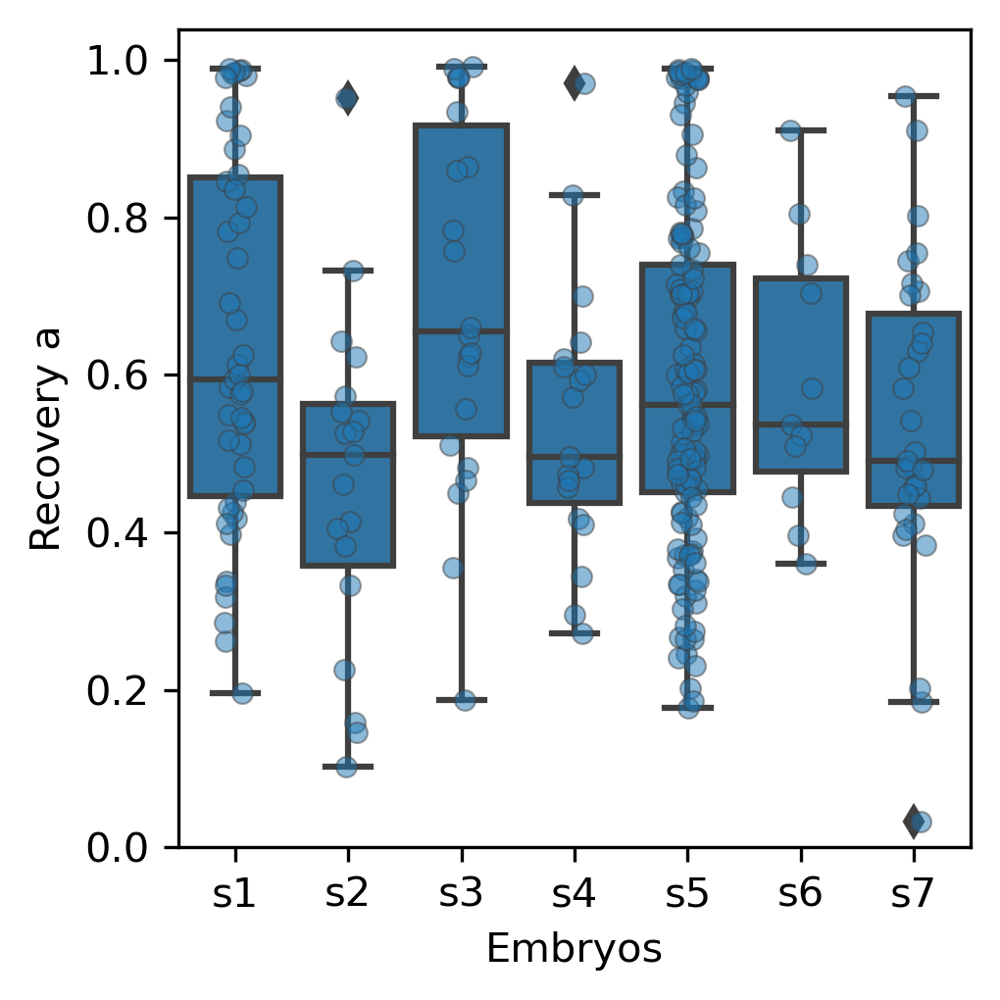

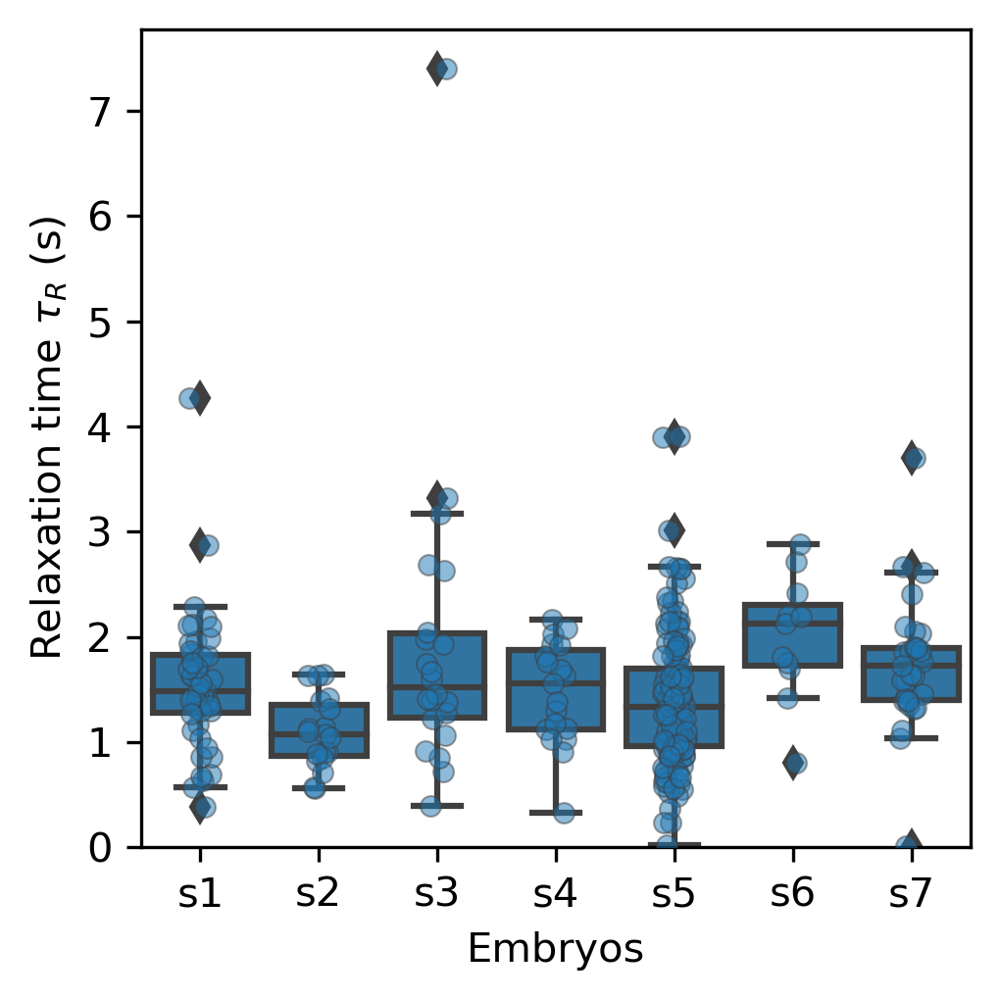

In [ ]:
# Only interphase

save_to_server= False
# Define the mapping
mapping = {'y': 'Interphase', 'n': 'M-phase'}

# Create a new column based on the mapping
df_results_jeff_filtered['Phase'] = df_results_jeff_filtered['MT_STATUS'].map(mapping)


df_median_stats = pd.DataFrame(columns=['mean', 'std', 'median', 'q1', 'q3', 'parameter'])

for (param, label) in zip(params + ['a', 'tau_r'], ['$\kappa$ (pN / $\mathrm{\\mu m}$)', '$\gamma_1$ (pN s/ $\mathrm{\\mu m}$)', '$\gamma_2$ (pN s/ $\mathrm{\\mu m}$)', 'Recovery a', 'Relaxation time $\\tau_R$ (s)']):

    df = df_results_jeff_filtered

    # Calculate statistics
    stats = df.groupby(['MT_STATUS', 'EMBRYO'])[param].agg(['mean', 'std', 'median', lambda x: np.percentile(x, 25), lambda x: np.percentile(x, 75)])
    stats.columns = ['mean', 'std', 'median', 'q1', 'q3']
    stats = stats.reset_index()
    stats = stats.sort_values(by='MT_STATUS', ascending=False)

    # Create subplots
    fig = plt.figure(figsize=(3.5, 3.5), dpi=300)

    # First subplot: Combined boxplot and stripplot
    sns.boxplot(x='EMBRYO', y=param, data=df[df["Phase"]=='Interphase'], color=sns.color_palette("tab10")[0])
    sns.stripplot(x='EMBRYO', y=param, dodge=True, data=df[df["Phase"]=='Interphase'], jitter=True, alpha=0.5, linewidth=0.5, legend=False)
    plt.xticks(ticks=range(len(df[df['Phase']=='Interphase']['EMBRYO'].unique())), labels=['s' + str(i+1) for i in range(len(df[df['Phase']=='Interphase']['EMBRYO'].unique()))])

    plt.ylabel(label)
    plt.xlabel('Embryos')

    # Add custom legend to the first plot
    # plt.legend(loc='upper left')
    # plt.title('Interphase')

    plt.ylim(bottom=0)
    plt.tight_layout()
    if save_to_server:
        plt.savefig(f'{results_dir}results/result_{param}.svg', format='svg')
    plt.savefig(f'/Users/ursic/Desktop/result_interphase_{param}.svg', format='svg',  transparent=True)
    plt.show()

if save_to_server:
    df_median_stats.to_csv(f'{results_dir}results/results_jeffreys_model_stats_of_median.csv')

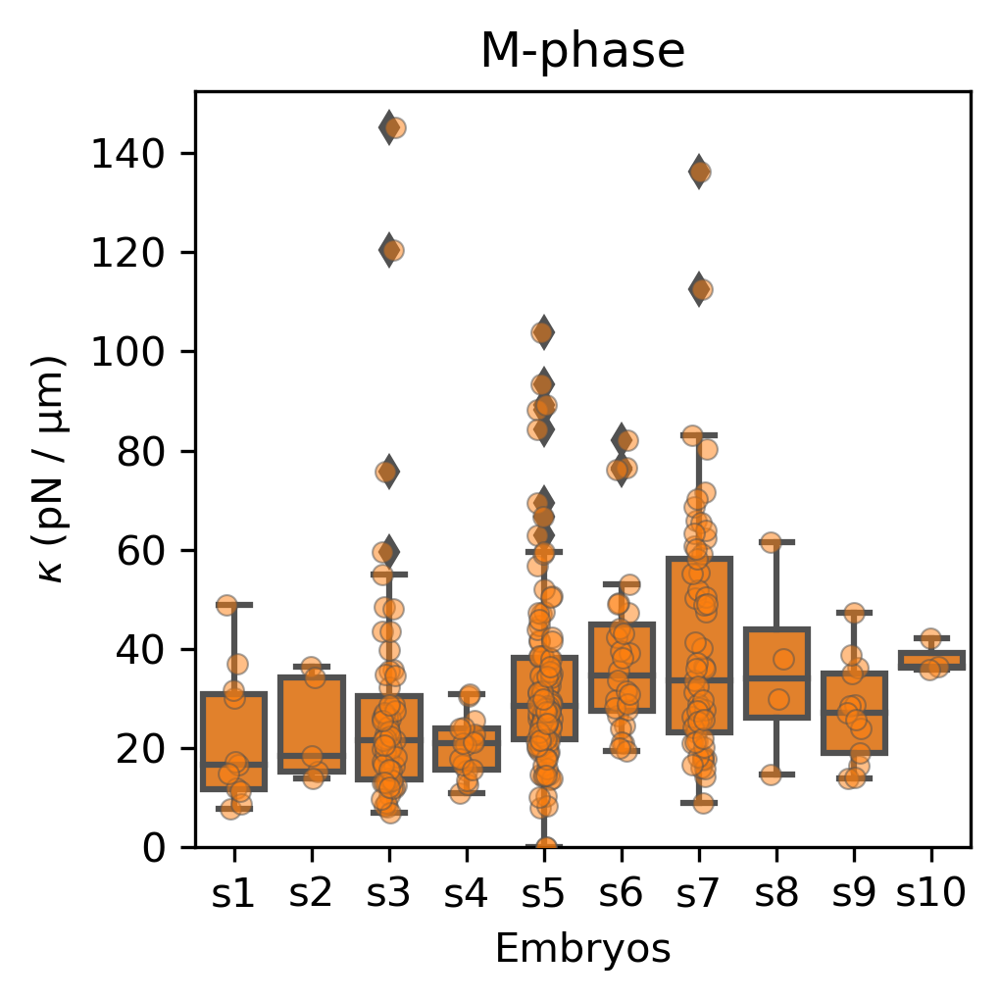

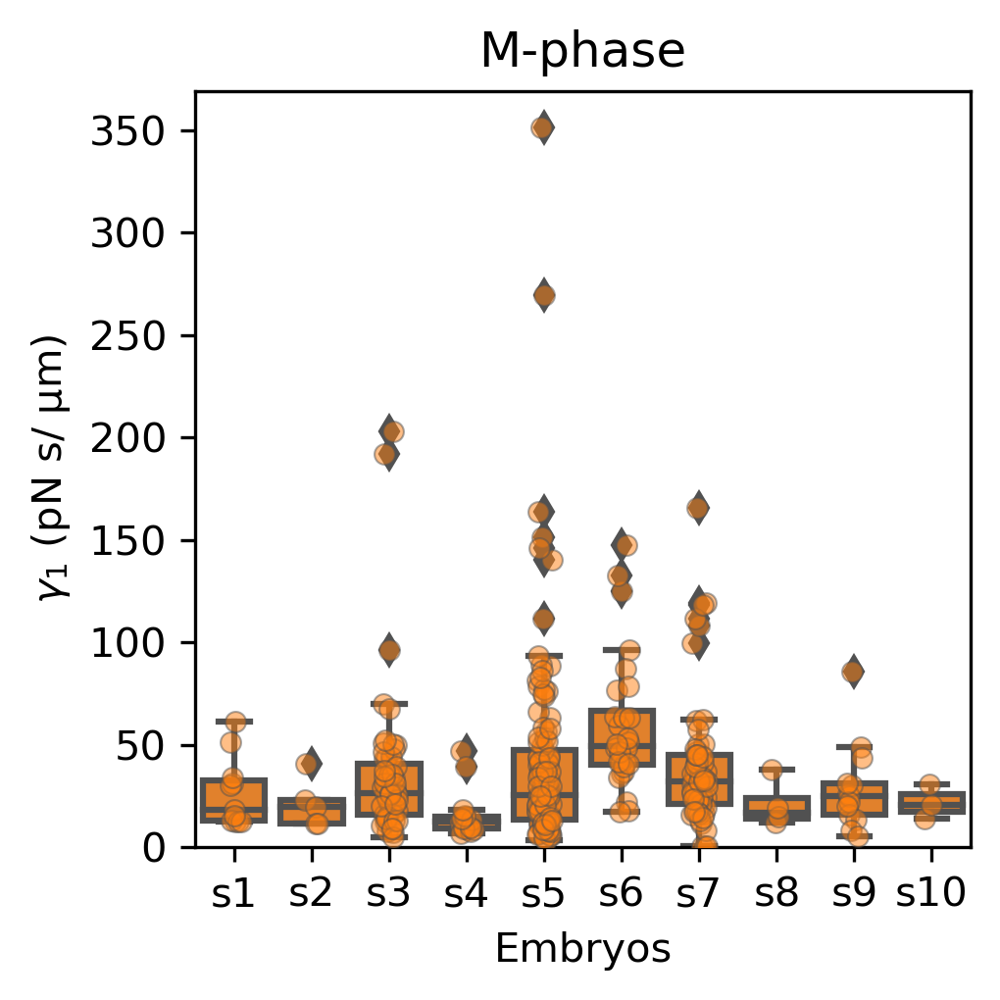

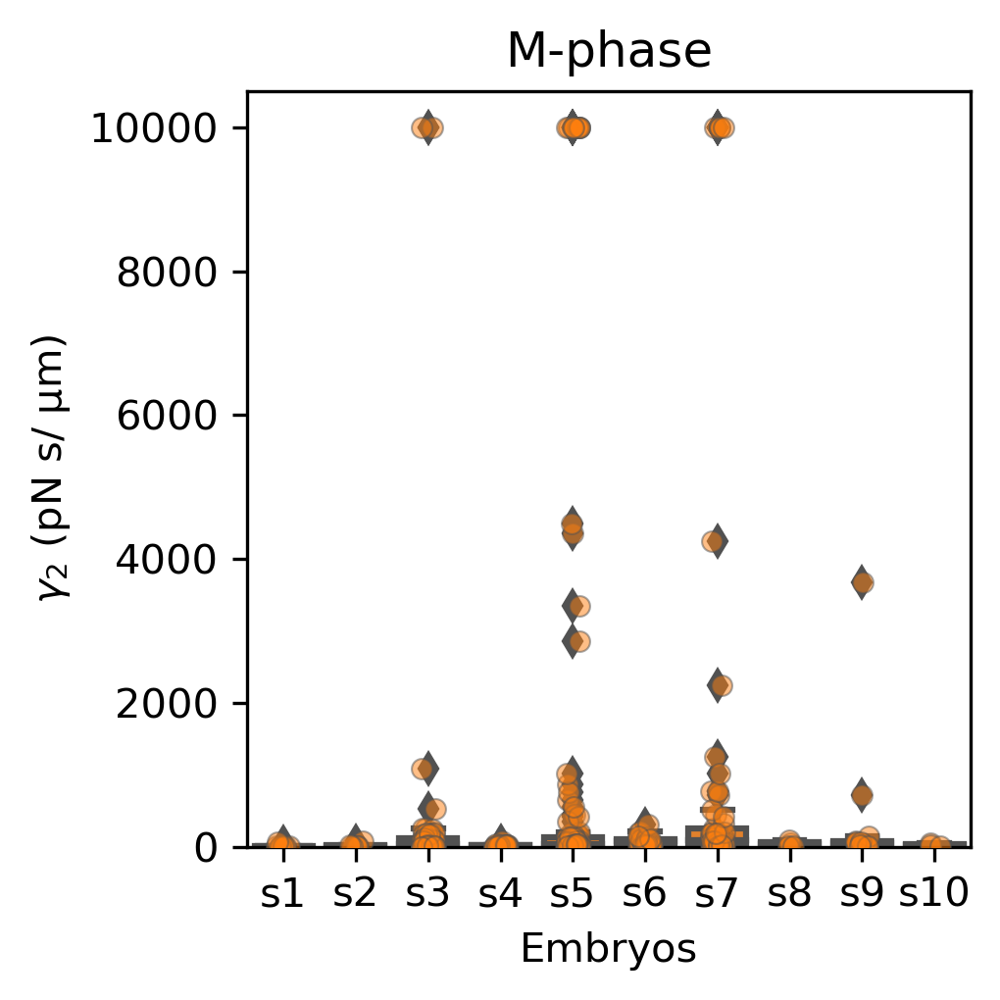

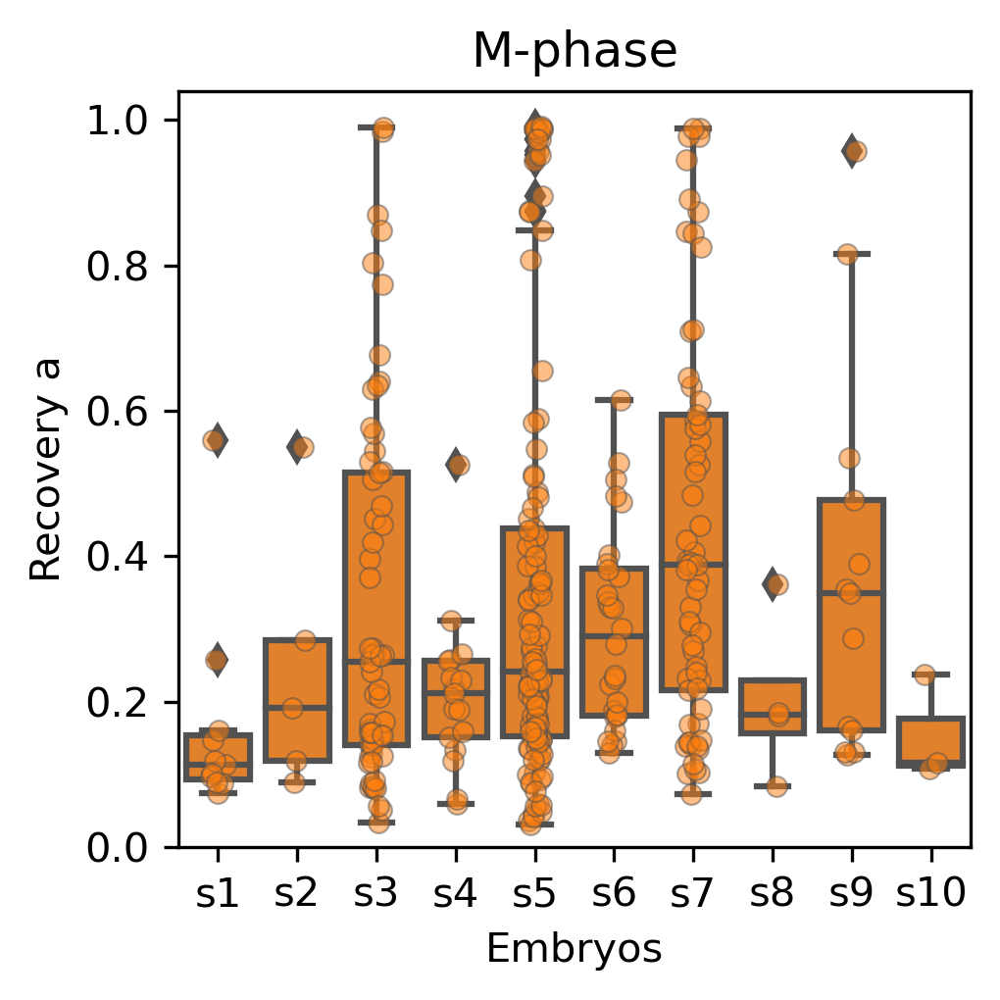

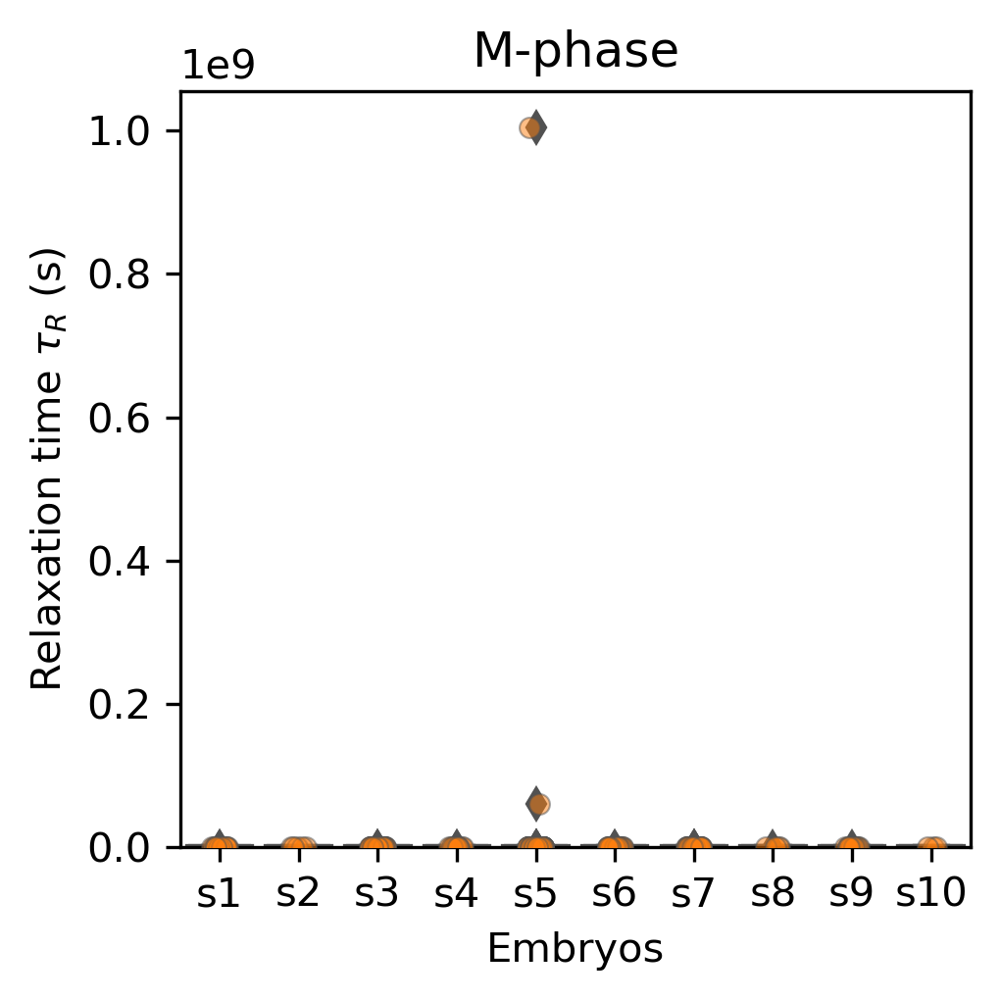

In [ ]:
# Only interphase

save_to_server= False
# Define the mapping
mapping = {'y': 'Interphase', 'n': 'M-phase'}

# Create a new column based on the mapping
df_results_jeff_filtered['Phase'] = df_results_jeff_filtered['MT_STATUS'].map(mapping)


df_median_stats = pd.DataFrame(columns=['mean', 'std', 'median', 'q1', 'q3', 'parameter'])

for (param, label) in zip(params + ['a', 'tau_r'], ['$\kappa$ (pN / $\mathrm{\\mu m}$)', '$\gamma_1$ (pN s/ $\mathrm{\\mu m}$)', '$\gamma_2$ (pN s/ $\mathrm{\\mu m}$)', 'Recovery a', 'Relaxation time $\\tau_R$ (s)']):

    df = df_results_jeff_filtered

    # Calculate statistics
    stats = df.groupby(['MT_STATUS', 'EMBRYO'])[param].agg(['mean', 'std', 'median', lambda x: np.percentile(x, 25), lambda x: np.percentile(x, 75)])
    stats.columns = ['mean', 'std', 'median', 'q1', 'q3']
    stats = stats.reset_index()
    stats = stats.sort_values(by='MT_STATUS', ascending=False)

    # Create subplots
    fig = plt.figure(figsize=(3.5, 3.5), dpi=300)

    # First subplot: Combined boxplot and stripplot
    sns.boxplot(x='EMBRYO', y=param, data=df[df["Phase"]=='M-phase'], color=sns.color_palette("tab10")[1])
    sns.stripplot(x='EMBRYO', y=param, dodge=True, data=df[df["Phase"]=='M-phase'], jitter=True, color=sns.color_palette("tab10")[1], alpha=0.5, linewidth=0.5, legend=False)
    plt.xticks(ticks=range(len(df[df['Phase']=='M-phase']['EMBRYO'].unique())), labels=['s' + str(i+1) for i in range(len(df[df['Phase']=='M-phase']['EMBRYO'].unique()))])

    plt.ylabel(label)
    plt.xlabel('Embryos')

    # Add custom legend to the first plot
    # plt.legend(loc='upper left')
    plt.title('M-phase')

    plt.ylim(bottom=0)
    plt.tight_layout()
    if save_to_server:
        plt.savefig(f'{results_dir}results/result_{param}.svg', format='svg')
    plt.show()

if save_to_server:
    df_median_stats.to_csv(f'{results_dir}results/results_jeffreys_model_stats_of_median.csv')